<a href="https://colab.research.google.com/github/federicodeluca/SkinCancer_Classification_ML/blob/main/ML_SkinCancer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SkinCancer_Classification_AI

**June 12, 2025**

Jacopo Martines , Federico De Luca #ing gestionali


#CAP_1 Skin Cancer Classification System

Il progetto consiste in un'applicazione di tecniche di Machine Learning al dataset HAM10000 ("Human Against Machine with 10000 training images"), un insieme di immagini dermatoscopiche ad alta risoluzione di lesioni cutanee. Le immagini contenute comprendono sette diverse categorie di lesioni della pelle, tra cui melanoma, cheratosi seborroica e nevi benigni. Il dataset è stato assemblato a scopo di ricerca per sviluppare modelli di classificazione in grado di fornire supporto nella diagnosi precoce di patologie cutanee, in particolare quelle potenzialmente maligne.

In linea con il suddetto scopo, in questo progetto sono stati utilizzati diversi approcci di Machine Learning volti alla classificazione automatica delle lesioni, e si è valutata la loro efficacia.

Nella sua formulazione "naturale", il problema consiste in una classificazione multiclasse (7 diverse classi) ed è particolarmente complesso a causa della somiglianza visiva tra diverse tipologie di lesioni cutanee e  della "rarità" di alcune delle forme di lesione (lo sbilanciamento delle classi sarà un tema discusso nel seguito). Oltre a trattare la precedente formulazione, nel progetto è stata effettuata una distinzione tra le classi di lesioni cutanee maligne (es. melanoma) e non maligne, dunque è stata affrontata la riformulazione di tipo binaria del problema di classificazione. Si noti che ponendo il problema in questo modo, diminuisce la sua difficoltà; tuttavia, questa configurazione ha rilevanza in un campo di applicazione medico.

Per affrontare il problema è stato inizialmente adottato un approccio di Machine Learning tradizionale, Support Vector Machines (SVM); successivamente è stato utilizzato un metodo neurale, basato su una rete neurale convoluzionale (CNN). Si è cercato di sfruttare la "profondità" di tale modello per ottenere rappresentazioni delle features (pixel delle immagini) utili per effettuare la classificazione.

## 1.1 Importing Libraries

Per svolgere il lavoro  è stato fatto uso principalmente delle librerie `pandas`, `keras` e `SciKitLearn`.

In [ ]:
import os
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Flatten, Dropout, Conv2D, MaxPooling2D, Rescaling
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.utils import load_img, img_to_array

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.svm import SVC
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    roc_auc_score
)

import kagglehub
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline


## 1.2 Loading the data

Inizialmente si scarica il dataset più aggiornato da Kaggle tramite kagglehub. Successivamente si stampa il percorso locale in cui è stato salvato il dataset


In [ ]:
# Download latest version
path = kagglehub.dataset_download("kmader/skin-cancer-mnist-ham10000")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/skin-cancer-mnist-ham10000



Il dataset HAM10000 contiene oltre 10.000 immagini di lesioni cutanee.
 Per motivi di gestione, le immagini sono suddivise in due sottocartelle distinte.
 In questa sezione esploriamo i nomi dei file delle prime 5 immagini presenti in ciascuna cartella.



In [ ]:
#Definizione dei percorsi delle due sottocartelle contenenti le immagini
image_dir_part1 = os.path.join(path, 'HAM10000_images_part_1')
image_dir_part2 = os.path.join(path, 'HAM10000_images_part_2')

print("Contents of HAM10000_images_part_1:", os.listdir(image_dir_part1)[:5])
print("Contents of HAM10000_images_part_2:", os.listdir(image_dir_part2)[:5])



Contents of HAM10000_images_part_1: ['ISIC_0028933.jpg', 'ISIC_0028394.jpg', 'ISIC_0027799.jpg', 'ISIC_0028100.jpg', 'ISIC_0027960.jpg']
Contents of HAM10000_images_part_2: ['ISIC_0030912.jpg', 'ISIC_0030585.jpg', 'ISIC_0033697.jpg', 'ISIC_0030062.jpg', 'ISIC_0031213.jpg']


In [ ]:
# Set random seeds for reproducibility
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)


Oltre alle due cartelle contenenti le immagini (`HAM10000_images_part_1` e `HAM10000_images_part_2`), il dataset include anche file CSV che contengono informazioni strutturate:
- **`HAM10000_metadata.csv`**: metadati associati alle immagini.

In [ ]:
# Check the contents of the downloaded directory
print(os.listdir(path))

['hmnist_8_8_RGB.csv', 'hmnist_28_28_RGB.csv', 'HAM10000_images_part_1', 'ham10000_images_part_1', 'hmnist_8_8_L.csv', 'HAM10000_images_part_2', 'ham10000_images_part_2', 'hmnist_28_28_L.csv', 'HAM10000_metadata.csv']


Carichiamo il file `HAM10000_metadata.csv` contenente informazioni aggiuntive su ciascuna immagine. I diversi tipi di informazioni presenti saranno descritti in seguito.

In [ ]:
# Caricamento del file CSV dei metadati
metadata = pd.read_csv(os.path.join(path, 'HAM10000_metadata.csv')) # Correct path using the downloaded dataset location
display(metadata.head()) # Use display for better output formatting

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


##1.3 Dataset Exploration

In questa sezione viene condotta un'analisi esplorativa del dataset HAM10000, che raccoglie metadati clinici associati a immagini di lesioni cutanee. L’obiettivo è descrivere la distribuzione delle variabili principali (diagnosi, età, sesso, zona anatomica) e verificare eventuali squilibri che potrebbero influenzare le performance dei modelli di classificazione.




In [ ]:
# Use the original metadata DataFrame
df_svm = metadata.copy()

# Drop rows with any missing values
df_svm = df_svm.dropna()

Il DataFrame contiene 9958 istanze, ognuna associata a una singola immagine. Le colonne presenti includono:

- `lesion_id`: identificativo univoco della lesione
- `image_id`: identificativo dell'immagine
- `dx`: diagnosi clinica (es. nevus, melanoma, etc.)
- `dx_type`: tipo di diagnosi (es. istologica, follow-up)
- `age`: età del paziente
- `sex`: sesso del paziente
- `localization`: zona anatomica della lesione

Tutte le istanze risultano complete (assenza di valori nulli dopo il `dropna()`).

In [ ]:
df_svm.info()
display(df_svm.head())

<class 'pandas.core.frame.DataFrame'>
Index: 9958 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     9958 non-null   object 
 1   image_id      9958 non-null   object 
 2   dx            9958 non-null   object 
 3   dx_type       9958 non-null   object 
 4   age           9958 non-null   float64
 5   sex           9958 non-null   object 
 6   localization  9958 non-null   object 
dtypes: float64(1), object(6)
memory usage: 622.4+ KB


,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


Il dataset HAM10000 include 7 classi diagnostiche, suddivise in lesioni benigne e maligne:

- **Benigne**: `bkl`, `df`, `nv`, `vasc`  
- **Maligne**: `akiec`, `bcc`, `mel`

Le classi sono sbilanciate: la maggior parte delle immagini appartiene a lesioni benigne, in particolare ai nevi melanocitici (`nv`)

In [ ]:
df_svm['dx'].value_counts()

,count
dx,
nv,6660
mel,1111
bkl,1089
bcc,514
akiec,327
vasc,142
df,115


Questo grafico mostra la frequenza delle diverse diagnosi presenti nel dataset. È evidente uno squilibrio tra le classi: la categoria `nv` (Nevi melanocitici) è largamente predominante, seguita da `mel` (Melanoma) e `bkl` (Lesioni tipo cheratosi benigna). Classi come `df`, `vasc` e `akiec` sono molto meno rappresentate. Questo sbilanciamento dovrà essere considerato in fase di training per evitare bias nel modello.


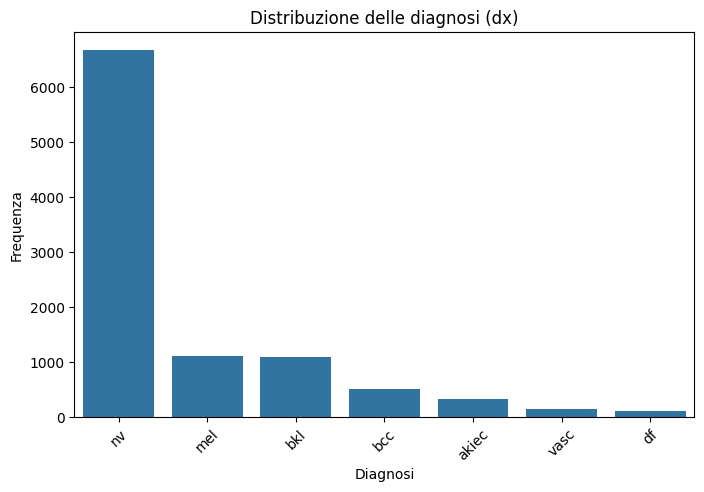

In [ ]:
#plot frequenza diagnosi
plt.figure(figsize=(8,5))
sns.countplot(data=df_svm, x='dx', order=df_svm['dx'].value_counts().index)
plt.title('Distribuzione delle diagnosi (dx)')
plt.xlabel('Diagnosi')
plt.ylabel('Frequenza')
plt.xticks(rotation=45)
plt.show()

La variabile `dx_type` indica il metodo con cui è stata ottenuta la diagnosi:
- `histo`: conferma istologica (la più affidabile)
- `follow_up`: osservazione nel tempo
- `consensus`: accordo tra esperti
- `confocal`: microscopia confocale

Circa la metà delle diagnosi è stata ottenuta tramite esame istologico, conferendo maggiore validità al dataset per compiti di classificazione.


In [ ]:
df_svm['dx_type'].value_counts()

,count
dx_type,
histo,5332
follow_up,3704
consensus,853
confocal,69


L’età dei pazienti segue una distribuzione normale asimmetrica, con un picco intorno ai 50 anni. La coda lunga a destra indica la presenza di pazienti anche oltre i 70 anni. Questa variabile potrebbe essere utile sia per l'analisi esplorativa che come feature nei modelli predittivi.


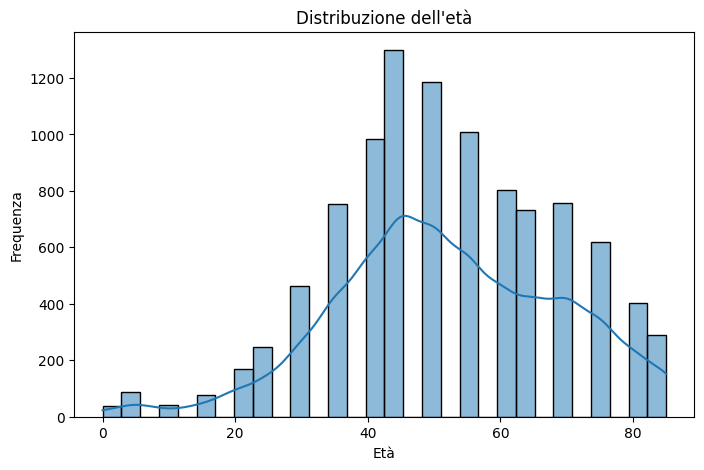

In [ ]:
# Distribuzione dell'età
plt.figure(figsize=(8,5))
sns.histplot(df_svm['age'], kde=True, bins=30)
plt.title('Distribuzione dell\'età')
plt.xlabel('Età')
plt.ylabel('Frequenza')
plt.show()



La variabile `sex` mostra una leggera predominanza di pazienti di sesso maschile rispetto a quello femminile. Una minima parte dei dati riporta `unknown`.


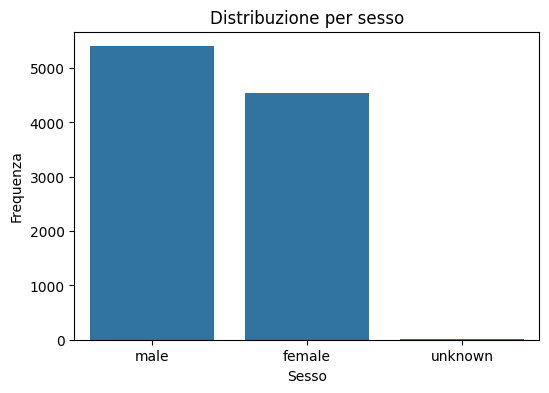

In [ ]:
# Distribuzione del sesso
plt.figure(figsize=(6,4))
sns.countplot(data=df_svm, x='sex')
plt.title('Distribuzione per sesso')
plt.xlabel('Sesso')
plt.ylabel('Frequenza')
plt.show()

Il grafico evidenzia la frequenza delle lesioni cutanee in diverse aree del corpo. Le regioni più comuni sono la schiena, gli arti inferiori e il tronco.


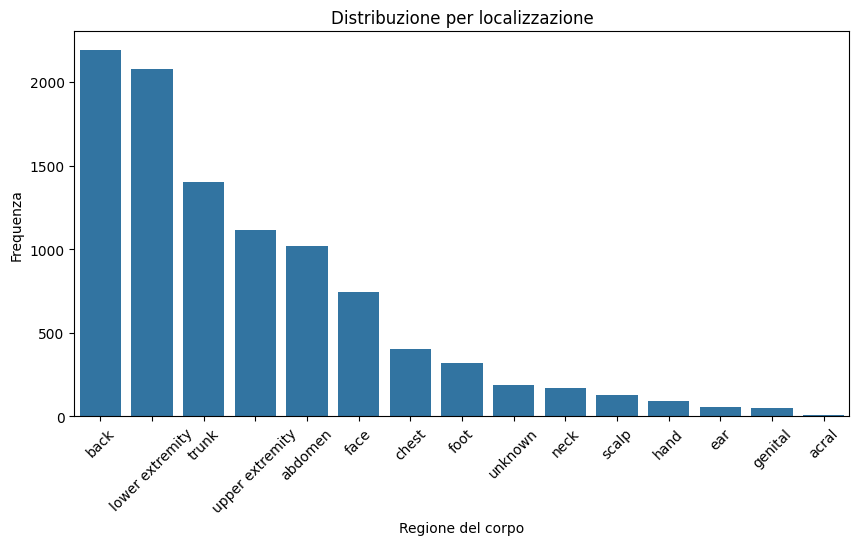

In [ ]:
# Distribuzione per zona anatomica (localization)
plt.figure(figsize=(10,5))
sns.countplot(data=df_svm, x='localization', order=df_svm['localization'].value_counts().index)
plt.title('Distribuzione per localizzazione')
plt.xlabel('Regione del corpo')
plt.ylabel('Frequenza')
plt.xticks(rotation=45)
plt.show()

#CAP_2 SVM using metadata

In questo capitolo applichiamo modelli SVM per classificare le lesioni cutanee del dataset HAM10000, utilizzando esclusivamente i metadati clinici associati a ciascuna immagine (età, sesso, zona anatomica, tipo di diagnosi).






L’obiettivo delle Support Vector Machines (SVM) è trovare l’iperpiano che massimizza la distanza minima tra l’iperpiano stesso e i punti di ciascuna classe, ovvero il margine.



Il classificatore a margine ottimale $h$ è definito come:

$$
h(x) = \text{sign}(w^T x - b)
$$

dove $(w, b) \in \mathbb{R}^n \times \mathbb{R}$ è la soluzione del seguente problema di ottimizzazione:

$$
\min \frac{1}{2} \|w\|^2 \quad \text{soggetto a} \quad y^{(i)}(w^T x^{(i)} - b) \geq 1
$$

L’obiettivo della funzione costo è minimizzare la norma del vettore $w$, il che equivale a massimizzare il margine, garantendo al contempo che tutti i punti del training set siano classificati correttamente e si trovino al di fuori del margine.




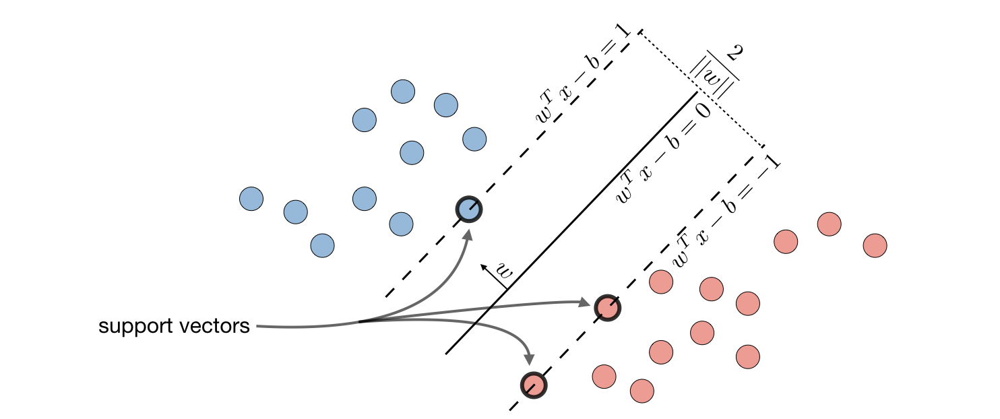

###Binary vs Multiclass Approach

Sono stati adottati due approcci distinti:

- **2.1 Binary classification**: le lesioni sono state etichettate come **maligne (1)** o **benigne (0)**. Le classi considerate maligne sono: `mel`, `bcc`, `akiec`.
- **2.2 Multi-class classification**: è stato applicato un approccio **One-vs-Rest (OvR)** per distinguere tra tutte e 7 le classi diagnostiche.

Questo confronto permette di valutare sia la capacità del modello nel riconoscere lesioni pericolose, sia la sua precisione nel distinguere le varie patologie.



Abbiamo scelto di applicare inizialmente un modello SVM sui metadati categoriali del dataset HAM10000 perché rappresentava un approccio rapido e computazionalmente leggero per valutare la capacità predittiva delle informazioni cliniche associate alle immagini. I metadati, come età, sesso e localizzazione anatomica della lesione, forniscono indizi diagnostici spesso rilevanti in ambito dermatologico e possono contribuire a discriminare efficacemente tra diverse tipologie di lesione cutanea. L’utilizzo di un SVM ci ha permesso di testare in modo diretto e interpretabile il valore informativo di queste variabili, costituendo una solida baseline da confrontare successivamente con modelli più complessi basati sull’analisi visiva delle immagini

##2.1 SVM Binary Classification: Malignant vs Benign using metadata

Abbiamo deciso di iniziare con un approccio di classificazione binaria utilizzando esclusivamente i metadati perché questo ci ha permesso di valutare rapidamente se informazioni non visive — come età, sesso e localizzazione anatomica — potessero già fornire segnali utili per distinguere tra lesioni maligne e benigne. Questo modello leggero rappresenta una baseline significativa, utile per confrontare successivamente il valore aggiunto derivante dall’uso delle immagini.


Per eseguire la classificazione binaria, abbiamo raggruppato tutte le tipologie di lesione considerate maligne — in particolare melanoma (`mel`), carcinoma basocellulare (`bcc`) e cheratosi attinica (`akiec`) — assegnando loro etichetta `1`. Tutte le altre tipologie di lesione sono state invece considerate benigne, con etichetta `0`. Questa binarizzazione riflette uno scenario clinico realistico, in cui l’obiettivo principale è identificare tempestivamente le lesioni potenzialmente pericolose.


In [ ]:
malignant_labels = ['mel', 'bcc', 'akiec']
y = [1 if dx in malignant_labels else 0 for dx in df_svm['dx']]

In questa fase abbiamo selezionato le variabili da utilizzare nel modello. La variabile `age` è stata trattata come numerica, mentre `sex`, `localization` e `dx_type` sono state considerate categoriche. Abbiamo poi utilizzato un `ColumnTransformer` per pre-processare i dati: le variabili numeriche sono state normalizzate con `StandardScaler`, mentre quelle categoriche sono state codificate tramite `OneHotEncoder`, rendendole compatibili con il classificatore SVM.


In [ ]:
# Selezione delle colonne numeriche e categoriche
col_names = ['age', 'sex', 'localization', 'dx_type']
categorical_cols = ['sex', 'localization', 'dx_type']
numeric_cols = ['age']

# creazione del trasformatore (#This estimator allows different columns or column subsets of the input to be transformed separately and the features generated by each transformer will be concatenated to form a single feature space)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(drop='first'), categorical_cols)  # drop='first' per evitare multicollinearità
    ]
)

features_scaled = preprocessor.fit_transform(df_svm[col_names])


Il dataset è stato suddiviso in un insieme di training (80%) e uno di test (20%) utilizzando una suddivisione stratificata. La stratificazione è importante in scenari di classificazione sbilanciata, perché garantisce che la distribuzione delle classi sia mantenuta coerente tra i due sottoinsiemi.


In [ ]:
#train-test split
X_train, X_test, y_train, y_test = train_test_split(
    features_scaled, y, test_size=0.2, random_state=1, stratify=y
)

Abbiamo addestrato un classificatore SVM utilizzando il kernel Radiale di Base (RBF), adatto per separazioni non lineari nello spazio delle feature. Inoltre, è stato attivato il parametro `class_weight='balanced'` per gestire lo sbilanciamento tra le classi, bilanciando automaticamente il peso delle classi in base alla loro frequenza. Il modello è stato configurato anche per restituire probabilità predittive (score delle classi, quanto siamo confidenti).


Nel caso in cui le classi non siano linearmente separabili, la formulazione standard dell’SVM introduce delle variabili di slack $\xi_i$ per penalizzare gli errori di classificazione, portando alla seguente funzione obiettivo:

$$
\min_{w,b,\xi} \ \frac{1}{2} \|w\|^2 + C \sum_{i=1}^{n} \xi_i
$$

Tuttavia, in presenza di classi sbilanciate, utilizzare un unico valore di $C$ per tutte le osservazioni potrebbe portare il modello a favorire la classe maggioritaria. Per risolvere questo problema, si utilizzano pesi diversi per ciascuna classe, come implementato in `scikit-learn` tramite il parametro `class_weight='balanced'`. In tal caso, il termine $C$ viene sostituito da un peso specifico per classe, ottenendo la seguente funzione:

$$
\min_{w,b,\xi} \ \frac{1}{2} \|w\|^2 + \sum_{i=1}^{n} C_i \, \xi_i \quad \text{dove} \quad C_i = w_{y_i} \cdot C
$$

In questa formulazione, $C_i$ dipende dalla classe dell’istanza $i$, e i pesi $w_{y_i}$ sono calcolati in modo inversamente proporzionale alla frequenza della classe $y_i$ nel dataset:

$$
w_j = \frac{n}{k \cdot n_j}
$$

dove:

* $n$ è il numero totale di esempi,
* $k$ è il numero di classi,
* $n_j$ è il numero di esempi appartenenti alla classe $j$.

In questo modo, le osservazioni appartenenti a classi meno rappresentate ricevono un peso maggiore, contribuendo a bilanciare l’influenza delle classi nella funzione obiettivo e migliorare le prestazioni del modello, in particolare il recall della classe minoritaria.




Abbiamo scelto di utilizzare il kernel RBF (Radial Basis Function) poiché i metadati utilizzati — pur contenendo informazioni rilevanti — non risultano linearmente separabili nello spazio delle feature originali. Il kernel RBF consente di proiettare i dati in uno spazio a dimensionalità più elevata, dove è più probabile che esista una frontiera di separazione non lineare tra le classi. Questa scelta si è rivelata adatta al nostro problema, caratterizzato da feature eterogenee e da una distribuzione non facilmente separabile.


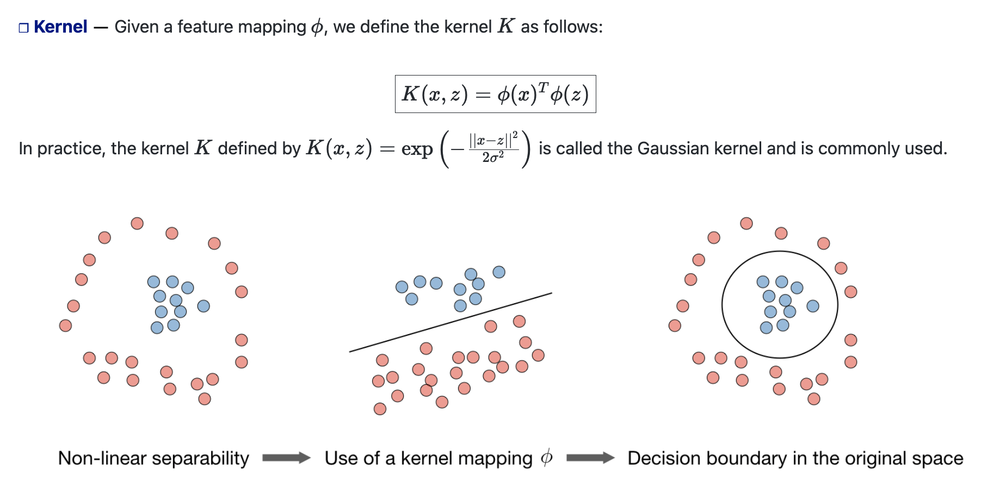

In [ ]:
#SVM
model_svc = SVC(kernel='rbf', class_weight='balanced', probability=True)
model_svc.fit(X_train, y_train)


y_pred = model_svc.predict(X_test)
y_proba = model_svc.predict_proba(X_test)[:, 1]


La matrice di confusione e il classification report riportano le prestazioni del modello sul test set. Il classificatore mostra un’alta precisione per la classe benigna, ma un richiamo più basso per la classe maligna, indicando che un numero rilevante di lesioni maligne viene erroneamente classificato come benigno. Questo limita l’affidabilità diagnostica del modello basato solo sui metadati e suggerisce la necessità di integrare anche le informazioni visive derivate dalle immagini.


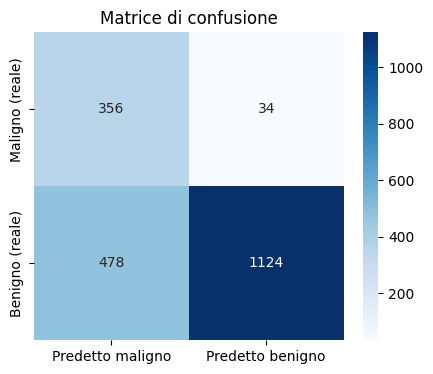

              precision    recall  f1-score   support

           0       0.97      0.70      0.81      1602
           1       0.43      0.91      0.58       390

    accuracy                           0.74      1992
   macro avg       0.70      0.81      0.70      1992
weighted avg       0.86      0.74      0.77      1992



In [ ]:
#confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=[1, 0])
confusion = pd.DataFrame(cm, index=['Maligno (reale)', 'Benigno (reale)'],
                           columns=['Predetto maligno', 'Predetto benigno'])

plt.figure(figsize=(5, 4))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues')
plt.title('Matrice di confusione')
plt.show()

#report della classificazione
print(classification_report(y_test, y_pred))

##2.2 MULTI_CLASS CATEGORICAL CLASSIFICATION SVM

In questa sezione affrontiamo il problema della classificazione multiclasse utilizzando esclusivamente i metadati. A differenza dell’approccio binario, qui il modello deve distinguere tra tutte le tipologie di lesione presenti nel dataset . Per farlo, utilizziamo un SVM con kernel RBF e strategia One-vs-Rest (`decision_function_shape='ovr'`), che addestra un classificatore binario per ogni classe rispetto alle restanti.


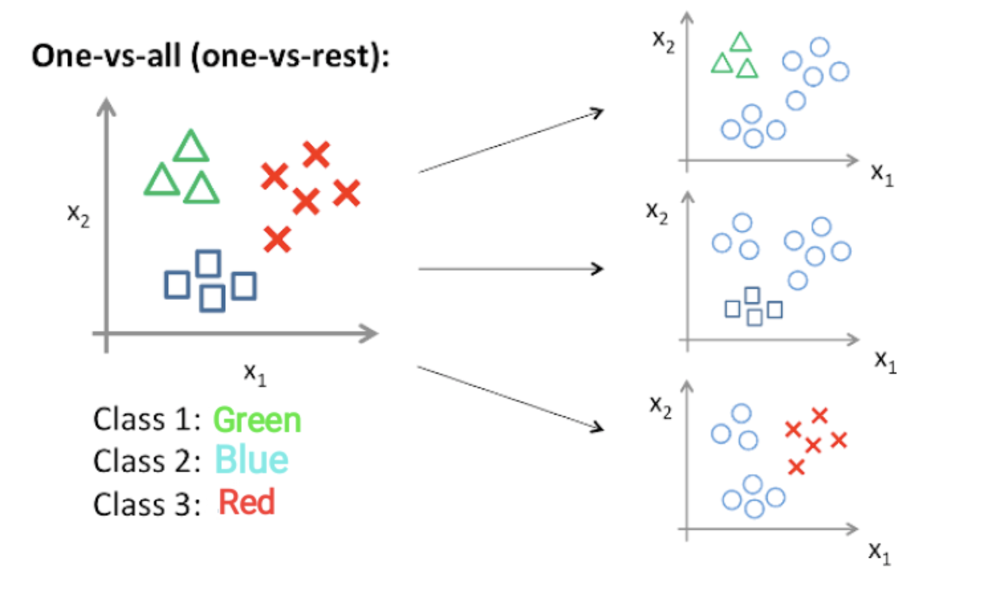

Il target è rappresentato dalla variabile `dx`, che contiene le etichette diagnostiche originali del dataset, suddivise in sette categorie: `akiec`, `bcc`, `bkl`, `df`, `mel`, `nv`, `vasc`. Questo approccio riflette una situazione clinica realistica in cui l’obiettivo è fornire una diagnosi automatica tra più possibilità.


In [ ]:
# Target multiclasse (dx ha più di due classi)
y = df_svm['dx']  # multiclasse: 'mel', 'bcc', 'nv', ecc.

# Colonne da usare come feature
#Analogamente all’approccio binario, anche qui i metadati vengono pre-elaborati attraverso un `ColumnTransformer`
#la variabile `age` viene normalizzata,
#mentre `sex` e `localization` sono codificate tramite One-Hot Encoding.
#Questo garantisce che tutte le feature siano numeriche e compatibili con il modello SVM.

col_names = ['age', 'sex', 'localization']
categorical_cols = ['sex', 'localization']
numeric_cols = ['age']

# ColumnTransformer: normalizza 'age', one-hot encode 'sex' e 'localization'
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(drop='first'), categorical_cols)
    ]
)

# Applica la trasformazione alle feature
X = preprocessor.fit_transform(df_svm[col_names])

# Train-test split stratificato (multiclasse)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)


Il classificatore SVM viene addestrato con kernel RBF, configurato per la classificazione multiclasse tramite la strategia One-vs-Rest. Inizialmente il modello è addestrato senza bilanciamento delle classi, e successivamente viene ripetuto con l’opzione `class_weight='balanced'` per gestire lo sbilanciamento significativo tra le etichette (ad esempio, la classe `nv` è molto più numerosa rispetto a `vasc` o `df`).


              precision    recall  f1-score   support

       akiec       0.00      0.00      0.00        66
         bcc       0.00      0.00      0.00       103
         bkl       0.41      0.34      0.38       218
          df       0.00      0.00      0.00        23
         mel       0.27      0.04      0.06       222
          nv       0.74      0.99      0.84      1332
        vasc       0.00      0.00      0.00        28

    accuracy                           0.70      1992
   macro avg       0.20      0.20      0.18      1992
weighted avg       0.57      0.70      0.61      1992



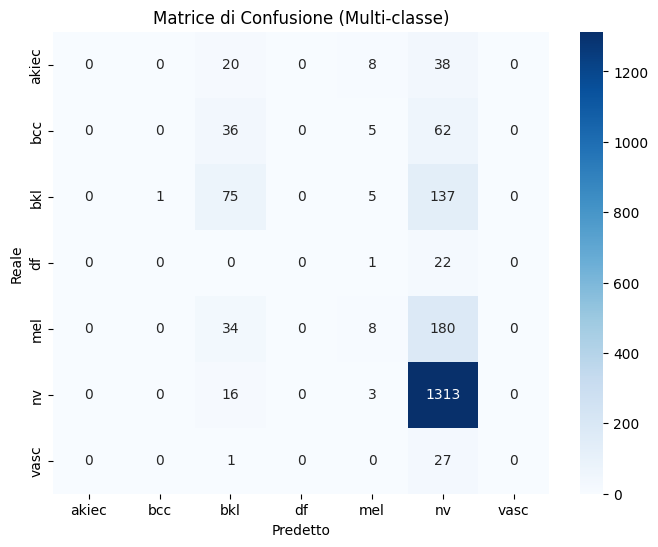

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

class_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
clf = SVC(kernel='rbf', decision_function_shape='ovr')  # one-vs-rest strategy
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predetto')
plt.ylabel('Reale')
plt.title('Matrice di Confusione (Multi-classe)')
plt.show()

Dai risultati emerge una forte predominanza della classe `nv`, che tende a essere predetta in modo sistematico a scapito delle altre classi, molte delle quali presentano valori di `recall` e `f1-score` prossimi allo zero. L'accuratezza complessiva, seppur apparentemente elevata, non è indicativa di una buona performance globale, in quanto è fortemente influenzata dallo sbilanciamento del dataset. L'aggiunta del parametro `class_weight='balanced'` migliora parzialmente le prestazioni per le classi minoritarie, ma non risolve del tutto il problema: questo evidenzia i limiti dell’approccio SVM applicato unicamente a feature categoriali per una classificazione fine tra più classi cliniche.


              precision    recall  f1-score   support

       akiec       0.15      0.45      0.23        66
         bcc       0.18      0.39      0.25       103
         bkl       0.32      0.05      0.09       218
          df       0.04      0.78      0.07        23
         mel       0.18      0.15      0.17       222
          nv       0.88      0.39      0.54      1332
        vasc       0.04      0.36      0.07        28

    accuracy                           0.33      1992
   macro avg       0.26      0.37      0.20      1992
weighted avg       0.66      0.33      0.41      1992



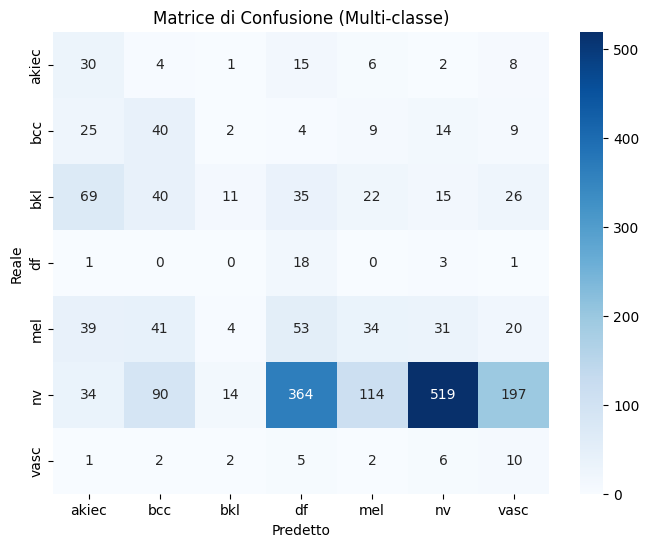

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report

clf = SVC(kernel='rbf', decision_function_shape='ovr', class_weight= 'balanced')  # one-vs-rest strategy
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predetto')
plt.ylabel('Reale')
plt.title('Matrice di Confusione (Multi-classe)')
plt.show()

I risultati ottenuti con l’utilizzo di SVM basati esclusivamente su metadati mostrano chiaramente i limiti di un approccio fondato su feature strutturate e categoriali. Sebbene queste informazioni possano contenere segnali utili, esse non sono sufficientemente rappresentative della complessità visiva delle lesioni cutanee. In particolare, la difficoltà nel distinguere classi cliniche molto simili (es. `bkl` vs `nv`) evidenzia la necessità di integrare informazioni visive più ricche. Per questo motivo, nella sezione successiva verrà esplorato l’uso diretto delle immagini dermatoscopiche, che permettono al modello di apprendere pattern morfologici e cromatici direttamente dai pixel, con l’obiettivo di migliorare significativamente l’accuratezza e la capacità discriminativa del sistema di classificazione.


#CAP_3 Image Data Loading

Il dataset HAM10000 contiene oltre 10.000 immagini suddivise in due cartelle (part_1 e part_2). Per poter accedere facilmente ai file immagine a partire dal file CSV dei metadati, definiamo una funzione che costruisce il percorso completo di ogni immagine. La funzione cercherà ogni file nella cartella corretta e restituirà il path assoluto. Applicheremo poi questa funzione all'intero dataset per ottenere, per ogni riga, il percorso del file immagine corrispondente. Infine, verificheremo che tutte le immagini siano state trovate correttamente.

In [ ]:
# Percorsi immagini
image_dir_part1 = os.path.join(path, 'HAM10000_images_part_1')
image_dir_part2 = os.path.join(path, 'HAM10000_images_part_2')

# Funzione che cerca l'immagine giusta
def get_full_image_path(image_id):
    filename = f"{image_id}.jpg"
    path1 = os.path.join(image_dir_part1, filename)
    path2 = os.path.join(image_dir_part2, filename)
    return path1 if os.path.exists(path1) else path2 if os.path.exists(path2) else None

# Applichiamola a tutto il dataset
metadata['image_path'] = metadata['image_id'].apply(get_full_image_path)

# Controlliamo che non ci siano immagini mancanti
missing = metadata['image_path'].isna().sum()
print(f"Immagini non trovate: {missing}")


Immagini non trovate: 0


In [ ]:
display(metadata.head())

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/kaggle/input/skin-cancer-mnist-ham10000/HAM10...
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/kaggle/input/skin-cancer-mnist-ham10000/HAM10...
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/kaggle/input/skin-cancer-mnist-ham10000/HAM10...
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/kaggle/input/skin-cancer-mnist-ham10000/HAM10...
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/kaggle/input/skin-cancer-mnist-ham10000/HAM10...


In [ ]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   image_path    10015 non-null  object 
dtypes: float64(1), object(7)
memory usage: 626.1+ KB


Per preparare i dati all'addestramento del modello, selezioniamo solo le colonne utili del DataFrame (image_path e dx, ovvero la diagnosi) ed eliminiamo eventuali righe incomplete. Successivamente, suddividiamo il dataset in tre insiemi: train (70%), validation (15%) e test (15%). Lo split è stratificato sulla colonna dx, così da mantenere in ogni sottoinsieme la stessa distribuzione delle classi originali. Questo è fondamentale per evitare squilibri nelle classi durante l’addestramento e la valutazione del modello.

In [ ]:
from sklearn.model_selection import train_test_split

# Prima: mappiamo il DataFrame per tenerci solo ciò che serve
df = metadata[['image_path', 'dx']].copy()
df = df.dropna()

In [ ]:
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  10015 non-null  object
 1   dx          10015 non-null  object
dtypes: object(2)
memory usage: 156.6+ KB


In [ ]:
# Take a smaller fraction of the data for faster processing
#df = df.sample(frac=0.1, random_state=42)

# Split stratificato: 70% train, 15% val, 15% test
train_df, temp_df = train_test_split(df, test_size=0.3, stratify=df['dx'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['dx'], random_state=42)


print("Train:", train_df.shape[0], "Val:", val_df.shape[0], "Test:", test_df.shape[0])

Train: 7010 Val: 1502 Test: 1503


Per facilitare l’utilizzo del dataset in fase di addestramento, salviamo le immagini in una struttura di cartelle suddivisa per split (train, val, test) e per classe (dx). In questo modo, ogni immagine verrà copiata in una sottocartella corrispondente alla propria etichetta diagnostica. Questo formato è compatibile con diversi data loader (come ImageFolder di PyTorch) che si basano sulla struttura a cartelle per inferire le etichette.

In [ ]:
import shutil
from tqdm import tqdm

# Dove salvare le immagini ordinate
base_dir = "/content/skin_split"

# Pulizia cartella per evitare duplicati da run precedenti
if os.path.exists(base_dir):
    shutil.rmtree(base_dir)
os.makedirs(base_dir, exist_ok=True)

def save_images(df, split):
    for label in df['dx'].unique():
        os.makedirs(os.path.join(base_dir, split, label), exist_ok=True)

    for row in tqdm(df.itertuples(), total=len(df)):
        dest = os.path.join(base_dir, split, row.dx, os.path.basename(row.image_path))
        shutil.copy(row.image_path, dest)

print("Campione ridotto:")
print("Train:", train_df.shape[0])
print("Val:", val_df.shape[0])
print("Test:", test_df.shape[0])

save_images(train_df, 'train')
save_images(val_df, 'val')
save_images(test_df, 'test')


Campione ridotto:
Train: 7010
Val: 1502
Test: 1503


100%|██████████| 1503/1503 [00:24<00:00, 62.32it/s]


Utilizziamo la funzione image_dataset_from_directory() di TensorFlow per creare i dataset di training, validation e test a partire dalla struttura di cartelle appena generata. Le etichette vengono inferite automaticamente dal nome delle sottocartelle (labels='inferred') e codificate in formato categorico (label_mode='categorical'), adatto a problemi di classificazione multiclasse. Le immagini vengono ridimensionate a 128x128 pixel e suddivise in batch da 32 elementi. Durante training e validation i dati vengono mescolati (shuffle=True), mentre nel test vengono mantenuti in ordine per garantire una valutazione corretta.

In [ ]:
train_data = tf.keras.utils.image_dataset_from_directory(
    '/content/skin_split/train',
    labels='inferred', #associa all'immagine che prende l'etichetta corrispondente leggendola dal nome della sottocartella
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=42
)

val_data = tf.keras.utils.image_dataset_from_directory(
    '/content/skin_split/val',
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=42
)

test_data = tf.keras.utils.image_dataset_from_directory(
    '/content/skin_split/test',
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=False,
    seed=42
)


Found 7010 files belonging to 7 classes.
Found 1502 files belonging to 7 classes.
Found 1503 files belonging to 7 classes.


##3.1 Training Data

In [ ]:
# Classi rilevate dal loader
training_class_names = train_data.class_names
training_class_names


['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

Per avere un controllo diretto sui file di training, creiamo manualmente un DataFrame che associa a ogni immagine il suo percorso e la rispettiva etichetta. Scorriamo le sottocartelle di skin_split/train, dove ogni cartella rappresenta una classe (training_class_names). Per ogni immagine, salviamo il percorso completo del file e la label corrispondente.
Questo DataFrame può essere utile per analisi esplorative, visualizzazioni o per creare generatori personalizzati.

In [ ]:
# Percorso delle immagini
training_path = '/content/skin_split/train'

# Estrazione path e label
image_paths = []
labels = []

for class_name in training_class_names:
    class_path = os.path.join(training_path, class_name)
    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        image_paths.append(image_path)
        labels.append(class_name)

# Creazione DataFrame
train_df = pd.DataFrame({
    'image_path': image_paths,
    'label': labels
})

train_df.head()


,image_path,label
0,/content/skin_split/train/akiec/ISIC_0026650.jpg,akiec
1,/content/skin_split/train/akiec/ISIC_0033358.jpg,akiec
2,/content/skin_split/train/akiec/ISIC_0030826.jpg,akiec
3,/content/skin_split/train/akiec/ISIC_0029210.jpg,akiec
4,/content/skin_split/train/akiec/ISIC_0032947.jpg,akiec


In [ ]:
# Numero immagini
print("Numero totale immagini:", train_df.shape[0])

# Duplicati
print("Duplicati:", train_df.duplicated().sum())

# Valori mancanti
print("Missing:\n", train_df.isna().sum())


Numero totale immagini: 7010
Duplicati: 0
Missing:
 image_path    0
label         0
dtype: int64


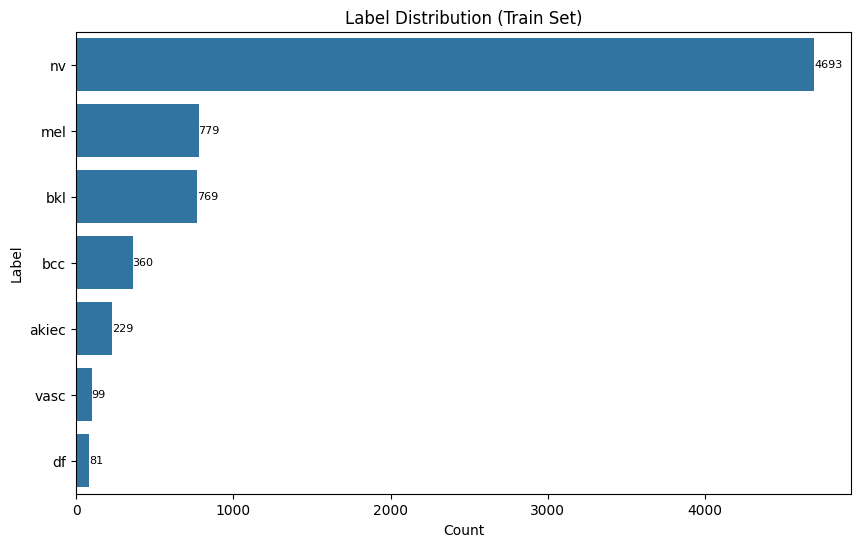

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

label_counts = train_df['label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(y=label_counts.index, x=label_counts.values)

for i, v in enumerate(label_counts.values):
    plt.text(v, i, str(v), color='black', ha='left', va='center', fontsize=8)

plt.xlabel('Count')
plt.ylabel('Label')
plt.title('Label Distribution (Train Set)')
plt.show()


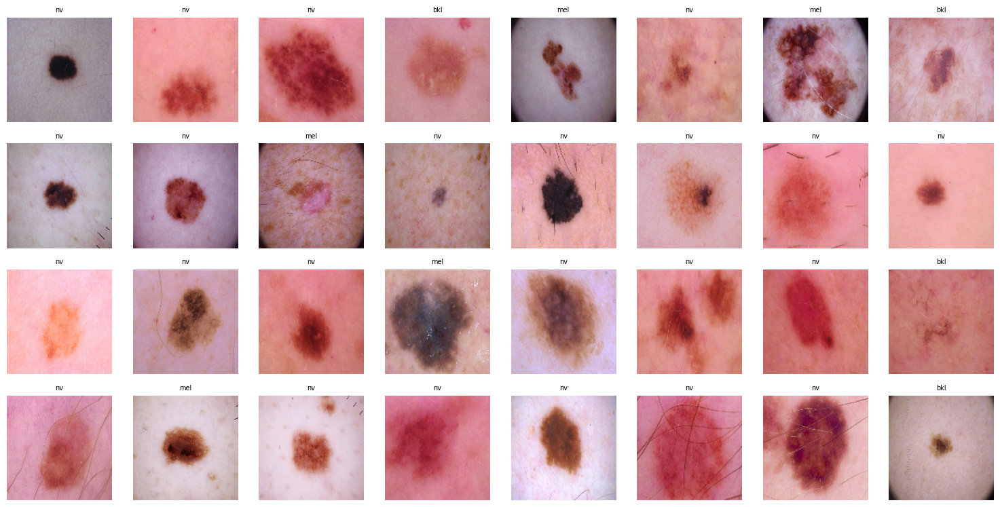

In [ ]:
import numpy as np
plt.figure(figsize=(15, 15))

for img_batch, label in train_data.take(1):
    for i in range(len(img_batch)):
        plt.subplot(8, 8, i + 1)
        plt.imshow(img_batch[i].numpy().astype("uint8"))
        plt.axis("off")
        label_index = np.argmax(label[i].numpy())
        plt.title(training_class_names[label_index], fontsize=7)

plt.tight_layout()
plt.show()


## 3.2 Validation Data

In [ ]:
# Percorso immagini validation
val_path = '/content/skin_split/val'

# Caricamento da directory
val_data = tf.keras.utils.image_dataset_from_directory(
    val_path,
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(128, 128),
    shuffle=True,
    seed=42,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
    pad_to_aspect_ratio=False,
    data_format=None,
    verbose=True,
)


Found 1502 files belonging to 7 classes.


In [ ]:
val_class_names = val_data.class_names

val_image_paths = []
val_labels = []

for class_name in val_class_names:
    class_path = os.path.join(val_path, class_name)
    for img in os.listdir(class_path):
        image_paths = os.path.join(class_path, img)
        val_image_paths.append(image_paths)
        val_labels.append(class_name)

val_df = pd.DataFrame({
    'image_path': val_image_paths,
    'label': val_labels
})

val_df.head()


,image_path,label
0,/content/skin_split/val/akiec/ISIC_0029811.jpg,akiec
1,/content/skin_split/val/akiec/ISIC_0024763.jpg,akiec
2,/content/skin_split/val/akiec/ISIC_0029638.jpg,akiec
3,/content/skin_split/val/akiec/ISIC_0026171.jpg,akiec
4,/content/skin_split/val/akiec/ISIC_0033456.jpg,akiec


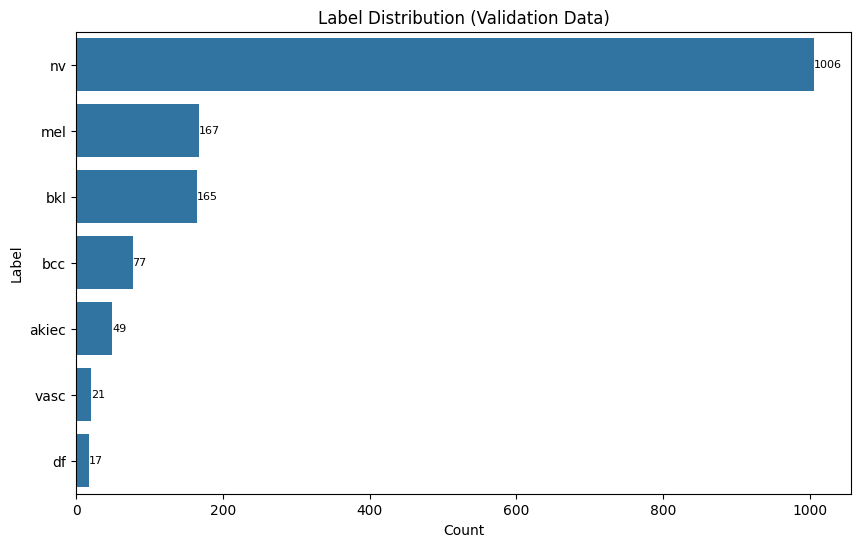

In [ ]:
val_counts = val_df['label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(y=val_counts.index, x=val_counts.values)

for i, v in enumerate(val_counts.values):
    plt.text(v, i, str(v), color='black', ha='left', va='center', fontsize=8)

plt.ylabel('Label')
plt.xlabel('Count')
plt.title('Label Distribution (Validation Data)')
plt.show()


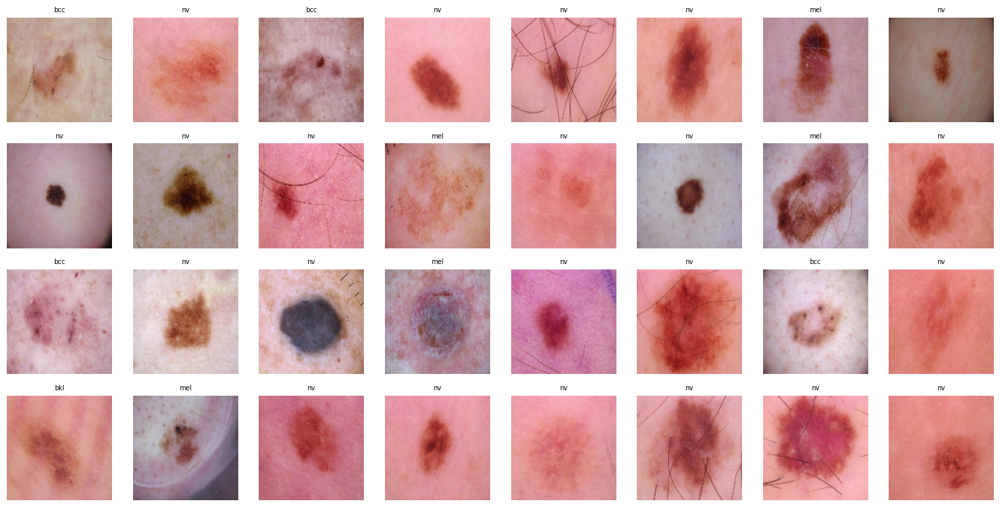

In [ ]:
plt.figure(figsize=(15, 15))

for img_batch, label in val_data.take(1):
    for i in range(len(img_batch)):
        plt.subplot(8, 8, i+1)
        plt.imshow(img_batch[i].numpy().astype('uint8'))
        plt.axis('off')
        label_index = np.argmax(label[i].numpy())
        plt.title(val_class_names[label_index], fontsize=7)

plt.tight_layout()
plt.show()


##3.5 Test Data

In [ ]:
test_path = '/content/skin_split/test'

test_data = tf.keras.utils.image_dataset_from_directory(
    test_path,
    labels="inferred",
    label_mode="categorical",
    class_names=None,
    color_mode="rgb",
    batch_size=32,
    image_size=(128, 128),
    shuffle=False,
    seed=42,
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
    pad_to_aspect_ratio=False,
    data_format=None,
    verbose=True,
)


Found 1503 files belonging to 7 classes.


In [ ]:
test_class_names = test_data.class_names

test_image_paths = []
test_labels = []

for class_name in test_class_names:
    class_path = os.path.join(test_path, class_name)
    for img in os.listdir(class_path):
        image_path = os.path.join(class_path, img)
        test_image_paths.append(image_path)
        test_labels.append(class_name)

test_df = pd.DataFrame({
    'image_path': test_image_paths,
    'label': test_labels
})

test_df.head()


,image_path,label
0,/content/skin_split/test/akiec/ISIC_0029533.jpg,akiec
1,/content/skin_split/test/akiec/ISIC_0025069.jpg,akiec
2,/content/skin_split/test/akiec/ISIC_0029659.jpg,akiec
3,/content/skin_split/test/akiec/ISIC_0031012.jpg,akiec
4,/content/skin_split/test/akiec/ISIC_0028499.jpg,akiec


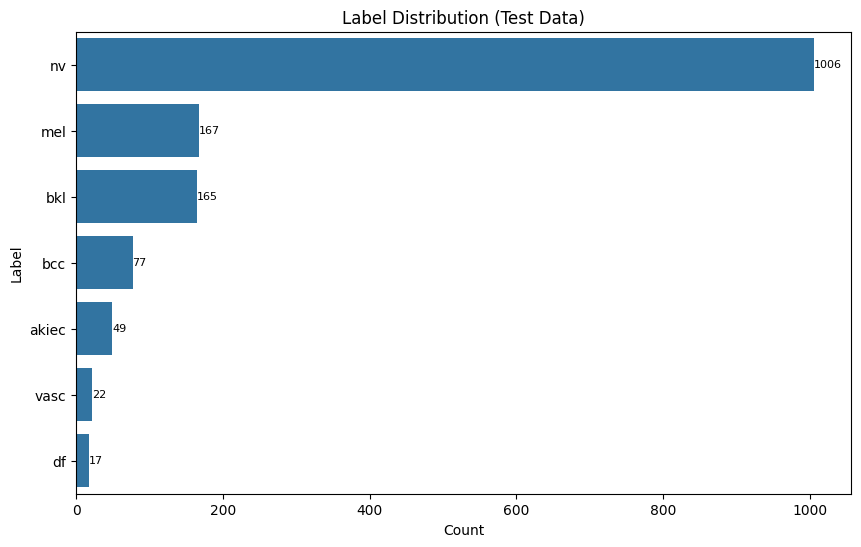

In [ ]:
test_counts = test_df['label'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(y=test_counts.index, x=test_counts.values)

for i, v in enumerate(test_counts.values):
    plt.text(v, i, str(v), color='black', ha='left', va='center', fontsize=8)

plt.ylabel('Label')
plt.xlabel('Count')
plt.title('Label Distribution (Test Data)')
plt.show()


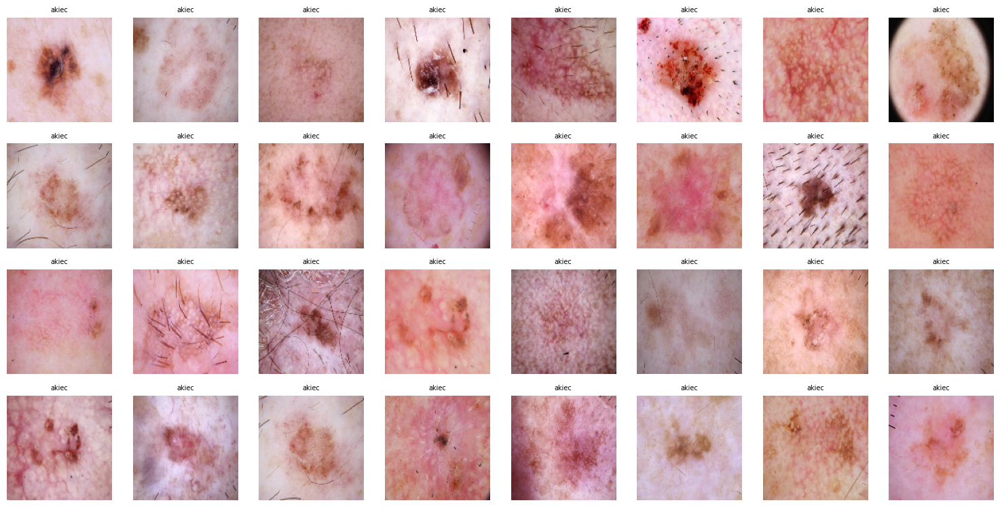

In [ ]:
plt.figure(figsize=(15, 15))

for img_batch, label in test_data.take(1):
    for i in range(len(img_batch)):
        plt.subplot(8, 8, i+1)
        plt.imshow(img_batch[i].numpy().astype('uint8'))
        plt.axis('off')
        label_index = np.argmax(label[i].numpy())
        plt.title(test_class_names[label_index], fontsize=7)

plt.tight_layout()
plt.show()


In [ ]:
#combined data
data = pd.concat([train_df, val_df, test_df], axis=0)
print(f"Total of {data.shape[0]} images used!")


Total of 10015 images used!


#CAP_4 SVM from pixel features

In questa sezione, viene adottato un nuovo spazio delle features per la descrizione delle istanze da classificare. Avendo caricato le immagini, il nuovo spazio delle features sarà dato dai pixel che le costituiscono. Si fa presente che ciascuna immagine è in formato RGB, cioè si compone di tre canali (red, green e blue), ciascuno dei quali ha una "matrice" di pixel associata.

La scelta si basa sull'ipotesi secondo cui le caratteristiche visive della lesione cutanea diano maggiori informazioni sulla sua classificazione rispetto alle informazioni qualitative precedentemente analizzate.

Coerentemente con quanto fatto in precedenza, il problema di classificazione sarà formulato precedentemente in modo binario (maligno vs non maligno), successivamente si tratterà l'originale formulazione, multiclasse.


##4.1 SVM from pixel features binary classification

Per formulare il problema come classificazione binaria si differenzia tra etichette "maligne", ossia `mel`, `bcc`, `akiec`, e le restanti.

In [ ]:
# Classi maligne: melanoma (mel), carcinoma basocellulare (bcc), carcinoma intraepidermico (akiec)
malignant_labels = ['mel', 'bcc', 'akiec']

# y sarà 1 per le lesioni maligne, 0 per tutte le altre
y = [1 if dx in malignant_labels else 0 for dx in df.dx]
print(y)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

Quando un'immagine viene caricata con la funzione `cv2.imread()`, essa viene trasformata in una struttura numerica tridimensionale, ovvero un array NumPy con forma (altezza, larghezza, 3).
I tre canali rappresentano i livelli di intensità dei colori blu, verde e rosso (BGR), ciascuno con valori interi compresi tra 0 e 255. Ogni pixel dell'immagine è quindi descritto da una terna di valori, uno per ciascun canale cromatico, che indica quanto il colore contribuisce visivamente a quel punto.



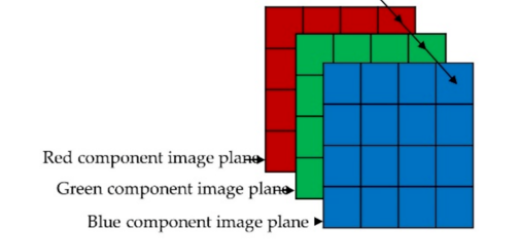


Dopo il caricamento, l'immagine viene ridimensionata alla dimensione 128x128, cosicchè non richiedano una quantità eccessivamente elevata di memoria e tempo di calcolo per essere processate, e riescano a mantenere le proprietà informative.

IL modello di machine learning tradizionale utilizzato (Support Vector Machine) richiede vettori, ossia array monodimensionali, in input. Dunque, la rappresentazione ridimensionata dell'immagine viene poi "appiattita" con il metodo `flatten()` in un unico vettore monodimensionale. In questo caso, un'immagine di dimensione 128×128 con 3 canali produce un vettore di 49.152 valori numerici. Ciascuna componente del vettore rappresenta l'intensità di uno specifico canale di colore (blu, verde o rosso) in un determinato pixel dell'immagine, in ordine sequenziale (Dal pixel più in alto a sinistra, si considerano i corrispondenti valori per ognuno dei tre canali, quindi si procede verso destra, al termine della riga si processa la successiva).

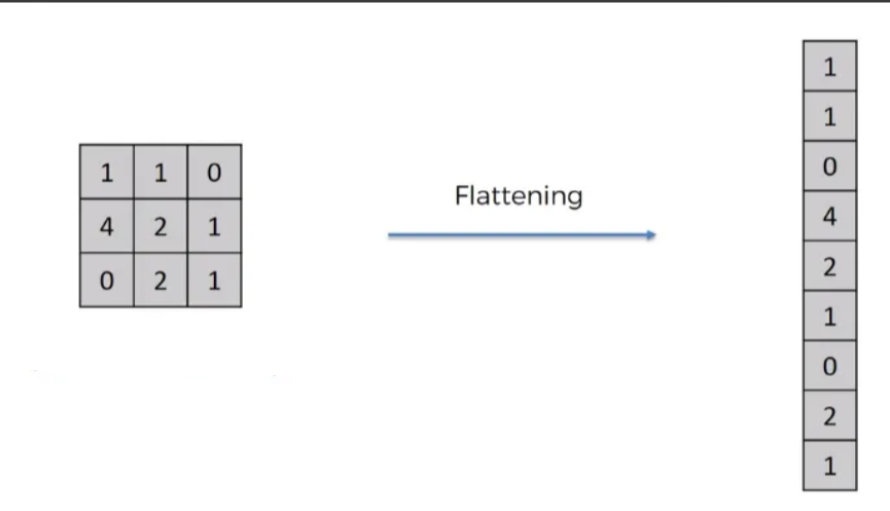


In [ ]:
# Estrazione feature da immagini
image_features = []
target_size = (128, 128)

for index, row in df.iterrows():
    image_path = row['image_path']
    image = cv2.imread(image_path)
    if image is not None:
        image = cv2.resize(image, target_size)
        image_flat = image.flatten()
        image_features.append(image_flat)
    else:
        print(f"Warning: Could not load image at {image_path}")



In [ ]:
X = np.array(image_features, dtype=np.float32)
print(f"Shape of feature array X: {X.shape}")


Shape of feature array X: (10015, 49152)


In [ ]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Length of y_train:", len(y_train))
print("Length of y_test:", len(y_test))

Shape of X_train: (8012, 49152)
Shape of X_test: (2003, 49152)
Length of y_train: 8012
Length of y_test: 2003


In [ ]:
print(set(y_train))
print(set(y_test))

{0, 1}
{0, 1}



A partire dal vettore ottenuto dal flattening, si standardizza ciascuna delle features utilizzando `StandardScaler` in modo che abbia media 0 e varianza pari a 1.
La standardizzazione viene effettuata perchè alcune features possono avere valori molto più grandi di altre, influenzando eccessivamente la distanza e quindi la direzione dell'iperpiano.
Inoltre, si previene che pixel con varianza maggiore "dominino" la norma euclidea usata per calcolare distanza.

In [ ]:
# Standardizzazione (molto importante per SVM)
import numpy as np
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Quando si lavora con dati ad alta dimensionalità (es. 49512 features nel nostro caso), si incorre nella cosiddetta _"curse of dimensionality"_: i dati risultano sparsi, i modelli perdono efficacia e cresce la complessità computazionale. In particolare, l'applicazione di un metodo basato sulle distanze perde di efficacia, trovando difficoltà nel trovare un margine chiaro.


Per affrontare questo problema, applichiamo la PCA (Principal Component Analysis): una tecnica di riduzione dimensionale che trasforma i dati in un nuovo sistema di coordinate. Ogni asse (componente principale) è una combinazione lineare delle feature originali, ordinata in base alla varianza spiegata.


La PCA cerca un iperpiano di dimensione ridotta $d' < d$ su cui proiettare i dati massimizzando la varianza spiegata. Formalmente, cerca il vettore $\mathbf{w}$ che massimizza:

Nel caso $d' = 1$, si cerca una retta (passante per la media $m$) su cui proiettare i dati $\mathbf{x}_1, \dots, \mathbf{x}_n$ in modo che l'errore quadratico totale:

$$
J(\alpha_1, \dots, \alpha_n, \mathbf{u}_1) = \sum_{i=1}^n \| \tilde{\mathbf{x}}_i - \mathbf{x}_i \|^2
$$

sia minimizzato; Dove $\tilde{\mathbf{x}}_i$ rappresenta la proiezione di $\mathbf{x}_1$ sulla retta.



Si dimostra che la direzione $\mathbf{u}_1$ che permette di minimizzare l'errore è quella che massimizza:

$$
\mathbf{u}_1^\top S \, \mathbf{u}_1 \quad \text{sotto vincolo} \quad \| \mathbf{u}_1 \| = 1
$$

dove $S$ è la matrice di covarianza campionaria:

$$
S = \frac{1}{n} \sum_{i=1}^n (\mathbf{x}_i - m)(\mathbf{x}_i - m)^\top
$$

Tramite moltiplicatori di Lagrange, la risoluzione porta alla classica equazione agli autovalori:

$$
S \, \mathbf{u}_1 = \lambda_1 \, \mathbf{u}_1
$$


Deriva che la somma delle distanze delle proiezioni dei punti da quelli originari è minimizzata (e la varianza delle proiezioni massimizzata) se si scelgono come direzioni del nuovo spazio gli autovettori corrispondenti ai $d'$ autovalori maggiori.

Per scegliere il numero $d'$ di componenti principali da mantenere, si analizza la varianza cumulativa spiegata. Tipicamente, gli autovalori della matrice di covarianza decrescono rapidamente, indicando che poche componenti spiegano la maggior parte dell'informazione.

La varianza cumulativa spiegata dai primi $k$ componenti è calcolata come:

$$
r_k = \frac{\sum_{i=1}^{k} \lambda_i^2}{\sum_{i=1}^{d} \lambda_i^2}
$$



Poichè si deve scegliere il numero di componenti da utilizzare per rappresentare i dati, si valuta la varianza cumulativa rispetto al numero di componenti, appena introdotta.

Text(0, 0.5, 'varianza cumulata')

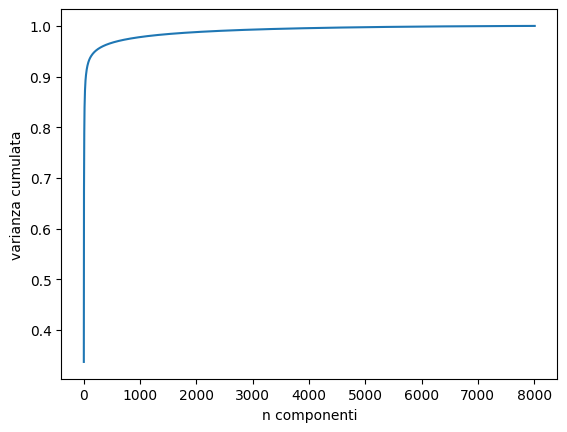

In [ ]:
from sklearn.decomposition import PCA
pca = PCA().fit(X_train)
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("n componenti")
plt.ylabel("varianza cumulata")


Si osserva che con 100 componenti, la varianza cumulata supera già il 95%, probabilmente anche il 97–98%.
Dopo i 100, i guadagni diventano molto marginali e aggiungere altri componenti spiega pochissima varianza aggiuntiva.

Si sceglie di utilizzare 100 componenti, mantenendo quasi tutta l'informazione, e riducendo drasticamente la complessità del problema.


In [ ]:
# PCA: riduci le feature da 49152 a 100 (o altro)
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

Il modello SVM utilizzato viene istanziato con un kernel Radiale di Base (Gaussian RBF), che permette di separare le classi non linearmente nello spazio trasformato.


La configurazione class_weight='balanced' è utilizzata a causa dello sbilanciamento delle classi, illustrato precedentemente.
Fa sì che vengano calcolati automaticamente i pesi da assegnare a ciascuna classe in base alla loro frequenza inversa. Così, le classi meno rappresentate non vengono ignorate dal modello.

Con probability=True, si fa in modo che il modello possa restituire probabilità di appartenenza alle classi (predict_proba()).



In [ ]:
# Istanzia e allena il modello SVM (con bilanciamento classi)
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
model_svc = SVC(kernel='rbf', class_weight='balanced', probability=True)
model_svc.fit(X_train_pca, y_train)

SVC(class_weight='balanced', probability=True)

In [ ]:
y_pred = model_svc.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7414
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.72      0.82      1612
           1       0.42      0.83      0.56       391

    accuracy                           0.74      2003
   macro avg       0.68      0.77      0.69      2003
weighted avg       0.84      0.74      0.77      2003



E' interessante confrontare i risultati con quelli ottenuti dallo stesso modello nella classificazione binary effettuata a partire dalle varibili categoriali. Pur ottenendo un accuracy comparabile (0,74), si nota come le performance del modello sono complessivamente leggermente peggiori in quanto diminuisce il valore della recall (0,83 vs 0,9) per i malignant label. Infatti, i falsi negativi per tale classe sono da considerare gli errori più gravi. Aumentano leggermente i valori di precision e recall per la classe 0 (not malignant).

Si ribadisce limita la limitata affidabilità diagnostica del modello, anche con l'integrazione delle informazioni visive derivate dalle immagini.



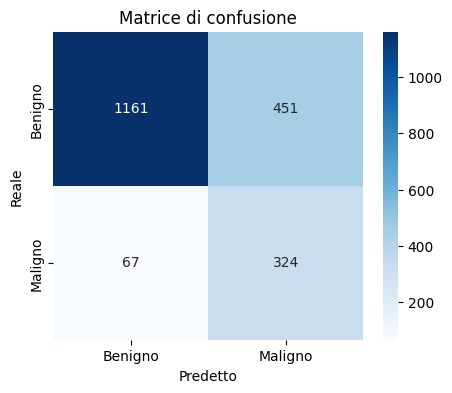

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benigno', 'Maligno'],
            yticklabels=['Benigno', 'Maligno'])
plt.xlabel('Predetto')
plt.ylabel('Reale')
plt.title('Matrice di confusione')
plt.show()


##4.2 SVM from pixel features on images multiclass classification

In questa sezione si affronta  il problema della classificazione multiclasse a partire dallo spazio delle features composto dai pixel delle immagini. Poichè cambiano le etichette del dataset, viene ri-effettuato lo split train-test.

In [ ]:
y = df['dx']  # multiclasse: 'mel', 'bcc', 'nv', ecc.

In [ ]:
# Split train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Length of y_train:", len(y_train))
print("Length of y_test:", len(y_test))

Shape of X_train: (8012, 49152)
Shape of X_test: (2003, 49152)
Length of y_train: 8012
Length of y_test: 2003


Poichè le features sono dello stesso tipo rispetto alla soluzione precedente, si effettua inizialmente la standardizzazione, successivamente si applica la PCA, in cui viene scelto, come nel caso precedente, un numero di componenti pari a 100.

In [ ]:
# Standardizzazione (molto importante per SVM)
import numpy as np
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Text(0, 0.5, 'varianza cumulata')

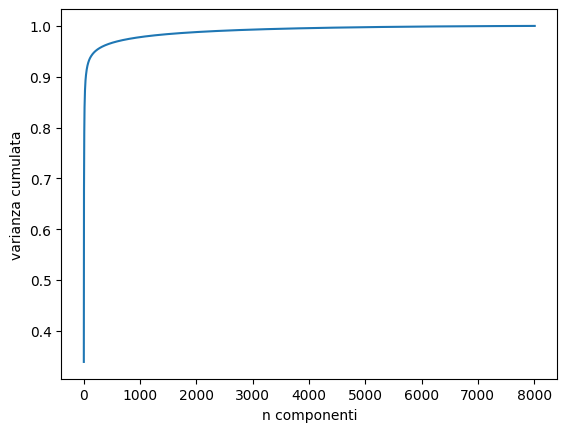

In [ ]:
from sklearn.decomposition import PCA
pca = PCA().fit(X_train)
import matplotlib.pyplot as plt
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("n componenti")
plt.ylabel("varianza cumulata")


In [ ]:
# PCA: riduci le feature da 49152 a 100 (o altro)
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

L'algoritmo utilizzato, come nel caso precedente, è il SVM. In questo caso va precisato `decision_function_shape='ovr' ` in quanto si tratta di un problema di classificazione multiclasse.  Per ogni classe, viene appreso un classificatore binario che la distingue da tutte le altre (appartenenza alla classe vs appartenenza ad una delle altre classi). Da ciascuno dei classificatori, per ogni istanza, risulta un punteggio che rappresenta la confidenza del modello nell'assegnazione dell'istanza alla classe. In fase di predizione, i nuovi dati vengono assegnati alla classe rispetto a cui la confidenza è maggiore.

In [ ]:
# Istanzia e allena il modello SVM (con bilanciamento classi)
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
model_svc = SVC(kernel='rbf', class_weight='balanced', decision_function_shape='ovr', probability=True)
model_svc.fit(X_train_pca, y_train)

SVC(class_weight='balanced', probability=True)

In [ ]:
y_pred = model_svc.predict(X_test_pca)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5821
Classification Report:
               precision    recall  f1-score   support

       akiec       0.27      0.51      0.35        65
         bcc       0.38      0.50      0.43       103
         bkl       0.37      0.47      0.42       220
          df       0.08      0.26      0.13        23
         mel       0.30      0.64      0.41       223
          nv       0.96      0.61      0.74      1341
        vasc       0.22      0.50      0.30        28

    accuracy                           0.58      2003
   macro avg       0.37      0.50      0.40      2003
weighted avg       0.75      0.58      0.63      2003



I risultati ottenuti continuano a non essere soddisfacenti. Tuttavia, va sottolineato un significativo miglioramento delle performance rispetto a quanto si era ottenuto per lo stesso problema, utilizzando unicamente le variabili categoriali come features: l'accuracy passa da 0,33 a 0,58; si ha, inoltre, un miglioramento generale delle metriche di performance per ciascuna delle classi.
Si sottolinea, infine, come i bassi valori di recall per le classi maligne come `mel` (0,6) escludano l'affidabilità diagnostica del sistema.

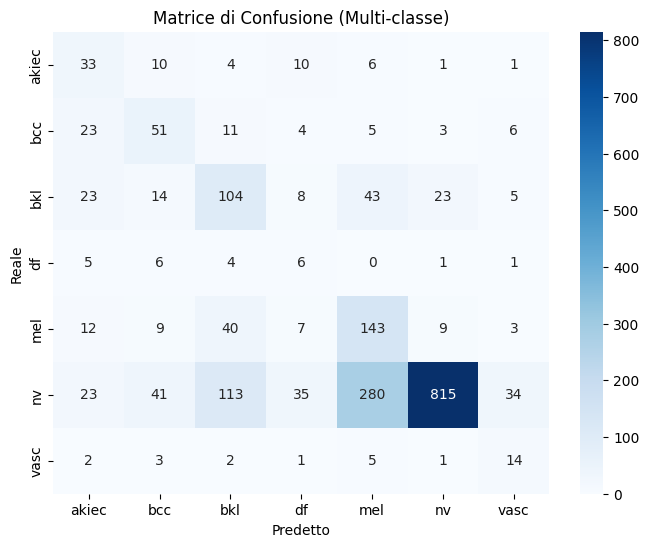

In [ ]:
class_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predetto')
plt.ylabel('Reale')
plt.title('Matrice di Confusione (Multi-classe)')
plt.show()

##4.3 SVM Feature engineering

A valle dei risultati non soddisfacenti ottenuti con il precedente approccio, prendendo spunto da lavori effettuati su dataset simili; abbiamo scelto di estrarre un insieme di caratteristiche descrittive da ciascuna immagine del dataset, con l'obiettivo di rappresentare ogni lesione cutanea attraverso un insieme compatto ma informativo di feature numeriche.

Le caratteristiche sono state suddivise in quattro categorie principali:

1. Colori: media dei canali rosso, verde e blu.
2. Forma: calcoli basati sui contorni, come area, perimetro, circolarità, asimmetria, diametro.
3. Texture: estratte mediante la matrice di co-occorrenza dei livelli di grigio (GLCM).
4. Statistica dell'intensità: entropia, skewness, kurtosis e media dell'immagine "equalizzata".

Tutte le feature vengono salvate in una lista di dizionari e infine convertite in un `DataFrame` pandas (`features_df`), che sarà usato per l'addestramento attraverso l'algoritmo SVM.

Si fa presente che questo approccio viene applicato al problema formulato come classificazione binaria.

In [ ]:
import numpy as np
import cv2
import pandas as pd
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy, skew, kurtosis

features = [] # Initialize features list

for index, row in df.iterrows():
    image_path = row['image_path']
    label = 1 if row['dx'] in malignant_labels else 0 # Get the label from the dataframe row
    image_rgb = cv2.imread(image_path)
    if image_rgb is None:
        continue

    mean_red = np.mean(image_rgb[:, :, 2])
    mean_green = np.mean(image_rgb[:, :, 1])
    mean_blue = np.mean(image_rgb[:, :, 0])

    # carica l'immagine in scala di grigi
    image_gray = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)

    if np.sum(image_gray) == 0:
        continue

    # Phase 2 : estrazione delle caratteristiche della forma
    # Resize image_gray before finding contours

    #Viene utilizzata cv2.findContours per trovare i contorni degli oggetti nell'immagine in scala di grigi.
    #Si seleziona il contorno più grande (max(contours, key=cv2.contourArea)) assumendo che corrisponda alla lesione.

    resized_gray = cv2.resize(image_gray, (128, 128))
    contours, _ = cv2.findContours(resized_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    asymmetry = 0
    perimeter = 0
    area = 0
    circularity = 0
    diameter = 0

    if contours:
        cnt = max(contours, key=cv2.contourArea) # Get the largest contour
        M = cv2.moments(cnt)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            # Asymmetry calculation needs points relative to the center
            asymmetry = np.mean([cv2.pointPolygonTest(cnt, (cx, cy), True) for point in cnt.squeeze()])
            perimeter = cv2.arcLength(cnt, True)
            area = cv2.contourArea(cnt)
            circularity = (4 * np.pi * area) / (perimeter ** 2) if perimeter != 0 else 0 # Avoid division by zero
            _, _, w, h = cv2.boundingRect(cnt)
            diameter = max(w, h)

    # Phase 3 :texture characteristics extraction with glcm
    # Ensure image_gray is of the correct data type for graycomatrix
    image_gray_uint8 = cv2.convertScaleAbs(image_gray)
    # Resize image_gray_uint8 to a smaller size for faster GLCM calculation if needed
    # resized_gray_uint8 = cv2.resize(image_gray_uint8, (64, 64)) # Optional: resize for performance
    glcm = graycomatrix(image_gray_uint8, distances=[1, 2, 3], angles=[0, np.pi/4, np.pi/2], symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]
    correlation = graycoprops(glcm, 'correlation')[0, 0]

    # Phase 4 : statistic characteristics
    equalized_image = cv2.equalizeHist(image_gray)
    hist_values, _ = np.histogram(equalized_image.ravel(), bins=256)
    # Ensure hist_values is not zero before calculating entropy
    hist_entropy = entropy(hist_values) if np.sum(hist_values) > 0 else 0
    hist_skewness = skew(equalized_image.ravel())
    hist_kurtosis = kurtosis(equalized_image.ravel())
    hist_mean = np.mean(equalized_image.ravel())

    # store the features
    features.append({
        'filepath': image_path,
        'label': label,
        'mean_red': mean_red,
        'mean_green': mean_green,
        'mean_blue': mean_blue,
        'asymmetry': asymmetry,
        'perimeter': perimeter,
        'circularity': circularity,
        'diameter': diameter,
        'contrast': contrast,
        'homogeneity': homogeneity,
        'energy': energy,
        'correlation': correlation,
        'hist_entropy': hist_entropy,
        'hist_skewness': hist_skewness,
        'hist_kurtosis': hist_kurtosis,
        'hist_mean': hist_mean
    })

# create a df with the extracted features
features_df = pd.DataFrame(features)
print(features_df.head())

                                            filepath  label    mean_red  \
0  /kaggle/input/skin-cancer-mnist-ham10000/HAM10...      0  208.736267   
1  /kaggle/input/skin-cancer-mnist-ham10000/HAM10...      0  197.138056   
2  /kaggle/input/skin-cancer-mnist-ham10000/HAM10...      0  214.053785   
3  /kaggle/input/skin-cancer-mnist-ham10000/HAM10...      0  195.708563   
4  /kaggle/input/skin-cancer-mnist-ham10000/HAM10...      0  211.709311   

   mean_green   mean_blue  asymmetry  perimeter  circularity  diameter  \
0  162.703426  181.659333       63.0      508.0     0.785398       128   
1  156.542415  177.196333       63.0      508.0     0.785398       128   
2  156.414959  174.070967       63.0      508.0     0.785398       128   
3  142.608015  157.175893       63.0      508.0     0.785398       128   
4  167.980289  185.249274       63.0      508.0     0.785398       128   

    contrast  homogeneity    energy  correlation  hist_entropy  hist_skewness  \
0  10.617407     0.3866



### Caratteristiche di colore
- `mean_red`, `mean_green`, `mean_blue`: media dei valori nei rispettivi canali RGB, utile per identificare variazioni cromatiche tra lesioni benigne e maligne.

### Caratteristiche di forma
- `asymmetry`: simmetria della lesione rispetto al centroide. Valori alti indicano forme irregolari.
- `perimeter`: lunghezza del contorno della lesione.
- `area`: area interna al contorno rilevato.
- `circularity`: misura della rotondità, calcolata come $4\pi \cdot \text{area} / \text{perimeter}^2$. Un valore vicino a 1 indica forma circolare.
- `diameter`: diametro massimo del bounding box della lesione.

###  Caratteristiche di texture (GLCM)
Estratte dalla matrice di co-occorrenza dei livelli di grigio
P(i,j)∈R N×N, dove ogni elemento rappresenta la frequenza (normalizzata) di tale co-occorrenza, i e j sono diversi valori di livelli di grigio.
- `contrast`: la variazione locale di intensità: valori alti indicano un’immagine con transizioni forti tra pixel vicini.
- `homogeneity`: misura quanto i valori dei pixel vicini sono simili. Valori alti indicano regioni uniformi.
- `energy`: uniformità o ripetitività dei pattern.
- `correlation`: misura la dipendenza lineare tra i valori di grigio nei pixel vicini. È simile alla correlazione statistica

###  Statistiche di intensità
Derivano dall'istogramma dei valori di intensità risultante dall'immagine in scala di grigi equalizzata, cioè a valle della ridistribuzione di tali valori in modo da aumentare il contrasto. A partire dai valori iniziali, essi vengono modificati in modo che si utilizzino tutti i valori della scala (da 0 a 255).

- `hist_entropy`: entropia dell'istogramma, misura della complessità visiva.
- `hist_skewness`: asimmetria della distribuzione dei pixel. Indica se la distribuzione è sbilanciata verso toni scuri (skewness < 0) o chiari (skewness > 0).
- `hist_kurtosis`: concentrazione dei pixel nei bordi (code della distribuzione).
- `hist_mean`: valore medio dell’intensità dopo equalizzazione.


In [ ]:
X = features_df.drop(columns=['filepath', 'label'])  # features
y = features_df['label']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Istanzia e allena il modello SVM (con bilanciamento classi)
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
model_svc = SVC(kernel='rbf', class_weight='balanced', probability=True)
model_svc.fit(X_train, y_train)

SVC(class_weight='balanced', probability=True)

In [ ]:
y_pred = model_svc.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5741
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.50      0.65      1615
           1       0.30      0.88      0.45       388

    accuracy                           0.57      2003
   macro avg       0.62      0.69      0.55      2003
weighted avg       0.82      0.57      0.61      2003



I risultati ottenuti sono generalmente peggiori (dal punto di vista dell'accuracy 0,57 vs 0,74) rispetto a quelli derivanti dall'approcio precedente, in cui era stata effettuata una PCA a partire dai valori di intensità dei pixel delle immagini. Tuttavia, si segnala l'aumento della recall riguardo ai malignant labels (0,88 vs 0,83). Per l'inadeguatezza dei risultati, non si è applicato l'approccio al problema multiclasse.

#CAP_5 CNN

In questa sezione passiamo a modelli deep learning basati unicamente sul contenuto visivo delle immagini. Una Convolutional Neural Network (CNN) è in grado di apprendere automaticamente pattern morfologici e cromatici che caratterizzano ciascuna categoria di lesione cutanea. Presentiamo due approcci: una CNN “pura” addestrata da zero e, nel capitolo successivo, una variante con mask(segmentazione preliminare) che mira a far concentrare la rete sulla sola area della lesione.


Una Convolutional Neural Network è un tipo di rete nurale usa prevalentemente per il processamento di immagini.



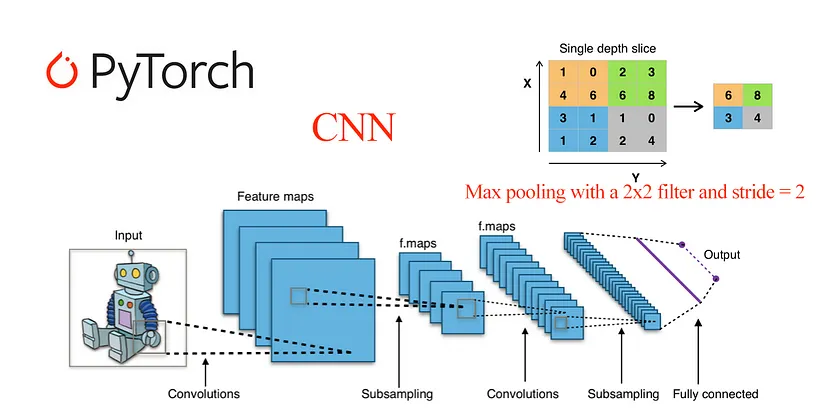

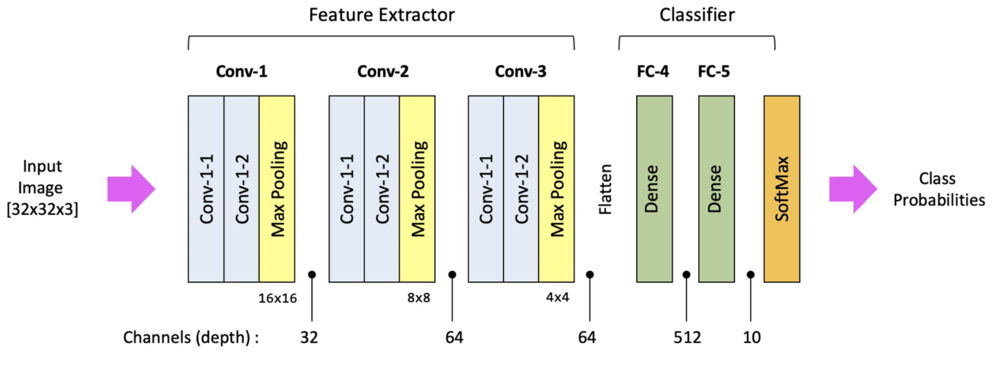

Si basa, fondamentalmente, su due tipologie di layer progettati specificamente per l’elaborazione delle immagini:



*   Layer convoluzionale
*   Layer di pooling




###Convolutional Layer

Il layer convoluzionale opera utilizzando dei filtri (detti anche kernel o maschere), ovvero matrici parametriche di dimensione predefinita che scorrono sull’immagine passo dopo passo, applicandosi iterativamente a sottoinsiemi di pixel e generando delle mappe di attivazione (feature maps)della seguente dimensione:

$$
\text{mapSize} = \dfrac{\text{inputSize} - \text{filterSize} + 2 \cdot \text{padding}}{\text{stride}} + 1
$$

dove:

* `inputSize` è la dimensione dell’immagine in ingresso
* `filterSize` è la dimensione del filtro convoluzionale
* `padding` è il margine di zeri eventualmente aggiunto ai bordi dell’immagine
* `stride` indica l’ampiezza del passo con cui il filtro scorre sull’immagine



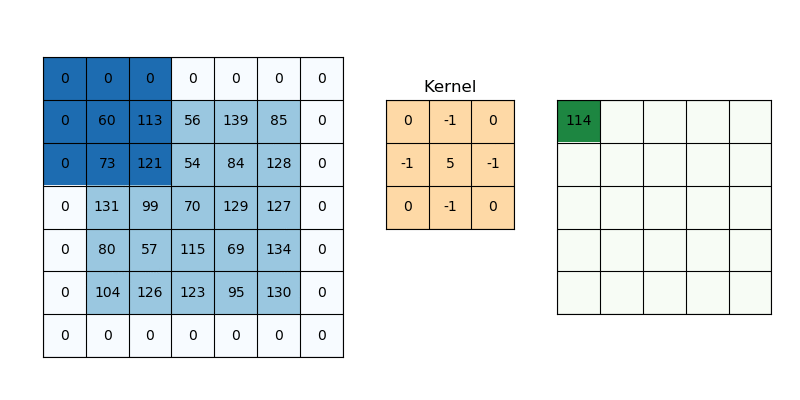

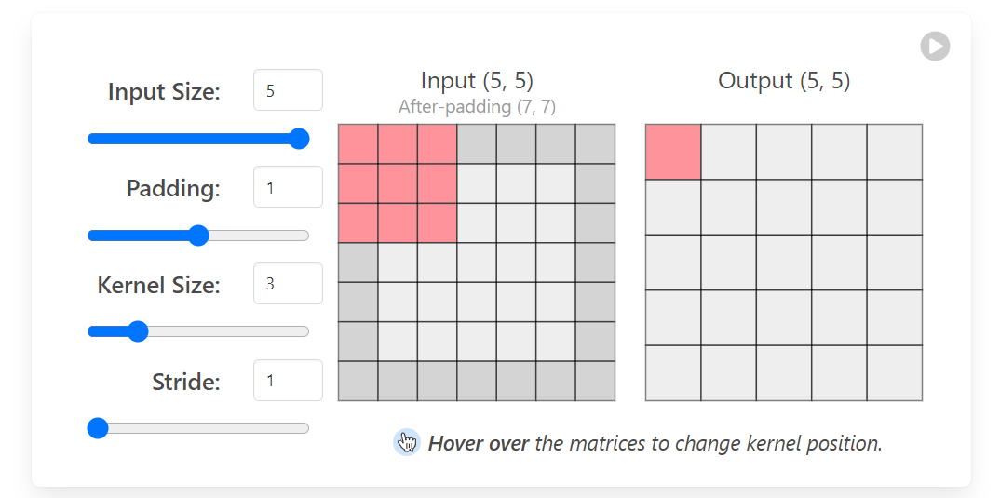

###Pooling Layer

Il layer di pooling, ad esempio il MaxPooling, è un layer che scorre sulle mappe di attivazione e ne calcola una rappresentazione più compatta, considerando solo i valori massimi all’interno di ciascun sottoinsieme di pixel delle feature map. Questo strato è utile per controllare il numero di parametri e ridurre la complessità del modello. Non contiene parametri addestrabili.


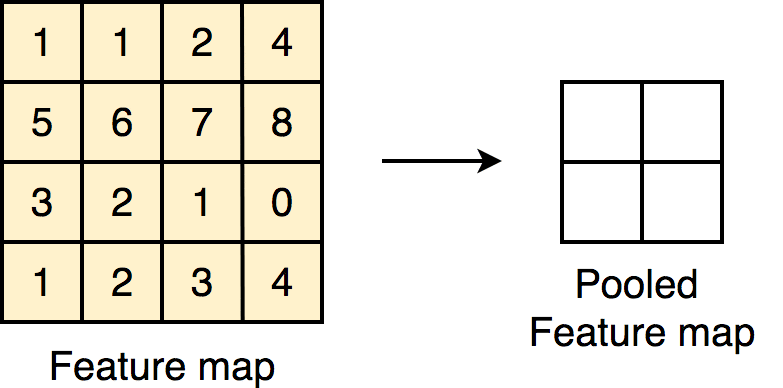

## 5.1 Training the Model

Il training viene condotto per 30 epoche con batch size 32 su immagini ridimensionate a 128×128 pixel. Per mitigare il rischio di overfitting e migliorare la convergenza utilizziamo:

* **Riduzione del learning rate on-plateau** (`ReduceLROnPlateau`): se la *validation loss* non diminuisce per due epoche consecutive, il learning rate viene ridotto di un fattore 0,3.
* **Class weighting**: come per l’SVM, sfruttiamo `class_weight='balanced'` per dare maggior peso alle classi meno rappresentate.


In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

lr_sched = ReduceLROnPlateau(monitor='val_loss', factor=0.3,
                             patience=2, min_lr=1e-6, verbose=1)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight('balanced',
                                     classes=np.unique(train_labels),
                                     y=train_labels)
class_weights = dict(enumerate(class_weights))

L’architettura scelta è composta da tre blocchi convoluzionali di complessità crescente (32 → 64 → 128 filtri), ciascuno strutturato come:

``Conv2D → BatchNorm → Conv2D → BatchNorm → MaxPool → Dropout``

* **Batch Normalization** stabilizza la distribuzione degli attivazioni accelerando l’addestramento.  
* **MaxPooling** dimezza progressivamente la risoluzione, estraendo feature sempre più astratte.  
* **Dropout (0,25)** riduce l’overfitting disattivando casualmente neuroni durante il training.

Al termine dei blocchi convoluzionali, il tensore viene flattened e passato a due densi (512 → 256 neuroni) con *ReLU* e Dropout 0,5, seguiti da un layer di uscita *softmax* a 7 unità (una per classe diagnostica).


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import EarlyStopping

cnn_model = Sequential()

# First block #32 feature maps
cnn_model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu', padding='same', input_shape=(128, 128, 3)))
cnn_model.add(BatchNormalization()) #dopo il convolution layer normalizzo i valori nella feature map
cnn_model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'))  # padding='valid' di default
cnn_model.add(BatchNormalization())
cnn_model.add(tf.keras.layers.MaxPooling2D(pool_size=2, strides=2))
cnn_model.add(Dropout(0.25))

#Second Block
cnn_model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same'))
cnn_model.add(BatchNormalization())
cnn_model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu'))
cnn_model.add(BatchNormalization())
cnn_model.add(tf.keras.layers.MaxPooling2D(pool_size=2, strides=2))
cnn_model.add(Dropout(0.25))

#Third Block
cnn_model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same'))
cnn_model.add(BatchNormalization())
cnn_model.add(tf.keras.layers.Conv2D(filters=128, kernel_size=3, activation='relu'))
cnn_model.add(BatchNormalization())
cnn_model.add(tf.keras.layers.MaxPooling2D(pool_size=2, strides=2))
cnn_model.add(Dropout(0.25))

In [ ]:
#Flatten
cnn_model.add(tf.keras.layers.Flatten())

In [ ]:
#Adding Neurons
cnn_model.add(tf.keras.layers.Dense(units=512, activation='relu'))
cnn_model.add(tf.keras.layers.Dense(units=256, activation='relu'))

#dropping
cnn_model.add(tf.keras.layers.Dropout(0.5))

In [ ]:
#Output Layer
cnn_model.add(tf.keras.layers.Dense(units=7, activation='softmax'))

Un aspetto cruciale nell’addestramento delle reti neurali è la scelta del learning rate, cioè la velocità con cui i pesi vengono aggiornati durante la discesa del gradiente. Un learning rate troppo alto può causare instabilità o divergenza, mentre uno troppo basso può rendere l’addestramento estremamente lento o farlo convergere verso minimi locali subottimali.

Utilizzare un learning rate costante lungo tutto il training è spesso inadeguato: l’andamento della funzione di perdita cambia nel tempo, e un valore ottimale iniziale può non esserlo più nelle fasi successive. Si può adottare una strategia predefinita di decrescita (ad esempio tramite un fattore costante o un decadimento esponenziale)  ma anche queste soluzioni richiedono ipotesi arbitrarie e difficili da stimare a priori.

Per affrontare queste criticità, sono stati introdotti metodi di ottimizzazione adattivi, che modificano dinamicamente il learning rate per ciascun parametro in base al comportamento osservato durante gli step precedenti. In particolare, il principio alla base di tecniche come RMSprop, Adagrad o Adam è che:

- Derivate (gradienti) ampie e persistenti su un parametro indicano un'elevata instabilità: in questo caso il learning rate viene ridotto per quel parametro, così da evitare oscillazioni o divergenze.
- Al contrario, gradienti piccoli o deboli suggeriscono che il parametro cambia lentamente: in questo caso il learning rate può essere aumentato, favorendo una convergenza più efficace.

In questo modo, ogni parametro ha un learning rate individuale che si adatta nel tempo, migliorando la stabilità e la velocità di convergenza complessiva del modello.

Introduciamo la formulazione matematica di Adagrad per arrivare a quella di RMSprop
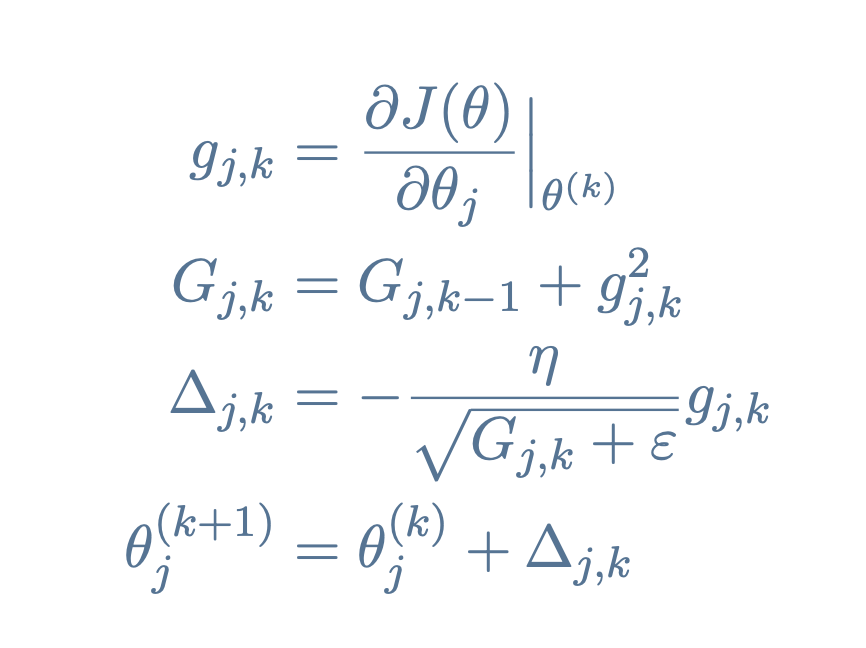

Per l’ottimizzazione si impiega **RMSprop** con learning rate iniziale 1e-4. RMSprop mantiene una media mobile dei quadrati dei gradienti, adattando in modo indipendente il passo di aggiornamento per ciascun peso (tramite il parametro 0<gamma<1 ): questo lo rende particolarmente indicato per reti con molti parametri e dataset mediamente rumorosi come HAM10000.

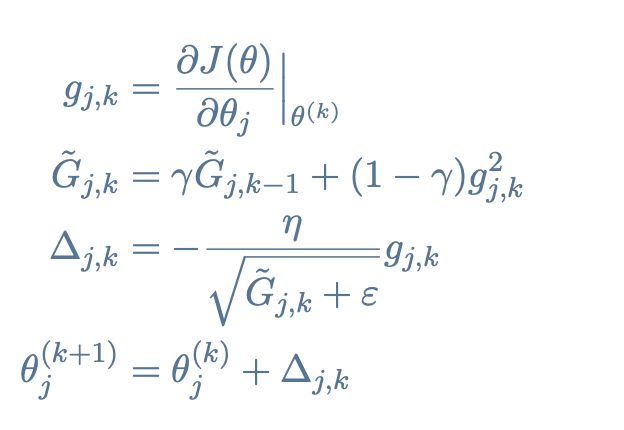

In [ ]:
#Optimizer setting
optimizer = RMSprop(learning_rate=0.0001)

#Compiling the model
cnn_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
#Early stopping
#early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, restore_best_weights=True)

In [ ]:
training_history = cnn_model.fit(train_data, epochs=30,
              validation_data=val_data,
              callbacks=[lr_sched],
              class_weight=class_weights)

Epoch 1/30
220/220 ━━━━━━━━━━━━━━━━━━━━ 17s 46ms/step - accuracy: 0.5472 - loss: 1.4416 - val_accuracy: 0.6784 - val_loss: 1.1312 - learning_rate: 3.0000e-05
Epoch 2/30
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.5584 - loss: 1.2404 - val_accuracy: 0.6897 - val_loss: 1.1832 - learning_rate: 3.0000e-05
Epoch 3/30
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.5841 - loss: 1.1570 - val_accuracy: 0.6897 - val_loss: 1.0950 - learning_rate: 3.0000e-05
Epoch 4/30
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.5935 - loss: 1.0641 - val_accuracy: 0.6884 - val_loss: 1.2081 - learning_rate: 3.0000e-05
Epoch 5/30
218/220 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5984 - loss: 1.0815
Epoch 5: ReduceLROnPlateau reducing learning rate to 8.999999772640877e-06.
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.5985 - loss: 1.0798 - val_accuracy: 0.7024 - val_loss: 1.4134 - learning_rate: 3.0000e-05
Epoch 6/30
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accurac

In [ ]:
#training history df
training_history_df = pd.DataFrame(training_history.history)

Il grafico seguente mostra che la *validation accuracy* si stabilizza intorno a 71 % mentre l’accuracy di training continua a crescere fino a circa 67%. L’andamento relativamente stabile della curva rossa conferma comunque una buona generalizzazione.


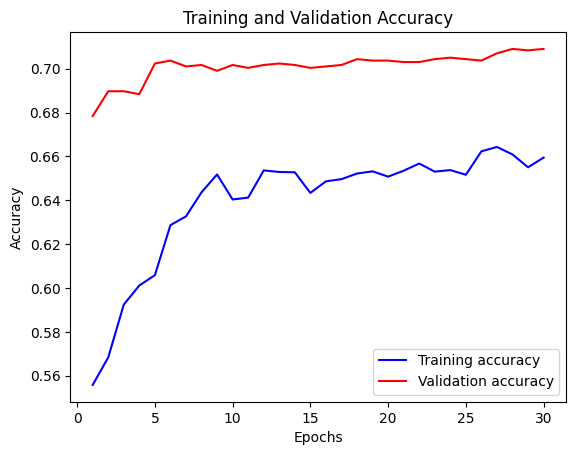

In [ ]:
# Plotting
epochs = range(1, len(training_history_df) + 1)
plt.plot(epochs, training_history_df['accuracy'], 'b', label='Training accuracy')
plt.plot(epochs, training_history_df['val_accuracy'], 'r', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Questa differenza potrebbe essere dovuta a dropout e normalization che si comportano in modo diverso nelle due fasi.

##5.2 Saving the model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Salvataggio del modello addestrato
cnn_model.save('/content/drive/MyDrive/cnn_model_skin.keras')


In [ ]:
from tensorflow.keras.models import load_model

# Caricamento del modello salvato
cnn_model = load_model('/content/drive/MyDrive/cnn_model_skin.keras')

In [ ]:
# Valutazione sul training set
train_loss, train_accuracy = cnn_model.evaluate(train_data)
print(f"Train Accuracy: {train_accuracy:.4f}")

# Valutazione sul validation set
val_loss, val_accuracy = cnn_model.evaluate(val_data)
print(f"Validation Accuracy: {val_accuracy:.4f}")


220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.7371 - loss: 0.9539
Train Accuracy: 0.7501
47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.7105 - loss: 1.3394
Validation Accuracy: 0.7091


##5.3 Prediction on one (personal) image

Per testare il modello su un caso singolo, offriamo la possibilità di caricare un’immagine personale tramite l’upload widget di Colab. L’immagine viene preprocessata (ridimensionamento 128×128, normalizzazione) e passata alla rete: il vettore di output *softmax* viene poi convertito nell’etichetta diagnostica più probabile.


In [ ]:
from google.colab import files

# Carica file dal tuo computer (si aprirà un selettore file)
uploaded = files.upload()


Saving IMG_9769.jpg to IMG_9769 (1).jpg


In [ ]:
file_name = list(uploaded.keys())[0]
print("Hai caricato:", file_name)


Hai caricato: IMG_9769 (1).jpg


In [ ]:
from tensorflow.keras.utils import load_img, img_to_array
import numpy as np

# Carica immagine
image_path = f"/content/{file_name}"

# Prepara immagine
image = load_img(image_path, target_size=(128, 128))
input_arr = img_to_array(image)
input_arr = np.expand_dims(input_arr, axis=0)
input_arr = input_arr / 255.0

# Predizione
prediction = cnn_model.predict(input_arr)
predicted_index = np.argmax(prediction[0])

# Stampa risultato
print("Classe predetta:", training_class_names[predicted_index])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Classe predetta: nv


In [ ]:
for i, prob in enumerate(prediction[0]):
    print(f"{training_class_names[i]}: {prob:.4f}")


akiec: 0.0000
bcc: 0.0000
bkl: 0.0000
df: 0.0000
mel: 0.0000
nv: 1.0000
vasc: 0.0000


##5.4 test data

L’accuratezza complessiva sul test set si attesta intorno al 70.6%, un risultato coerente con quanto osservato in fase di validazione. Tuttavia, l’analisi più fine tramite il classification report rivela importanti squilibri prestazionali tra le classi. In particolare, classi maggioritarie come *nv* (nevi) ottengono ottimi valori di precisione e recall (> 0.8), mentre le classi più rare, come *df* (dermatofibroma) o *bcc* (basalioma), risultano molto più difficili da identificare: in alcuni casi il recall scende sotto lo 0.2.










In [ ]:
from sklearn.metrics import classification_report

y_pred = cnn_model.predict(test_data)
predicted_categories = np.argmax(y_pred, axis=1)


true_categories = tf.concat([y for x, y in test_data], axis=0)
y_true = np.argmax(true_categories.numpy(), axis=1)

from sklearn.metrics import classification_report
print(classification_report(y_true, predicted_categories, target_names=test_class_names, digits=4))


47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
              precision    recall  f1-score   support

       akiec     0.2917    0.1429    0.1918        49
         bcc     0.4615    0.0779    0.1333        77
         bkl     0.3566    0.5879    0.4439       165
          df     0.1579    0.1765    0.1667        17
         mel     0.4865    0.1078    0.1765       167
          nv     0.8201    0.9155    0.8652      1006
        vasc     0.6000    0.4091    0.4865        22

    accuracy                         0.7059      1503
   macro avg     0.4535    0.3454    0.3520      1503
weighted avg     0.6859    0.7059    0.6695      1503



La matrice di confusione evidenzia che molti melanomi (mel) vengono classificati erroneamente come nevi (nv),suggerendo una difficoltà della rete nel distinguere pattern visivi simili ma clinicamente molto diversi.



<Figure size 1000x800 with 0 Axes>

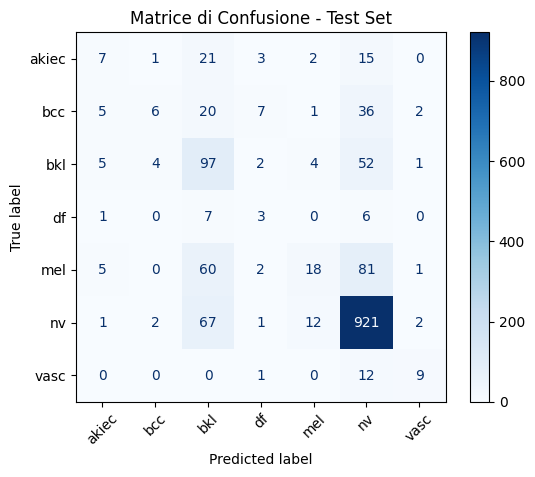

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Calcolo della matrice di confusione
cm = confusion_matrix(y_true, predicted_categories)

# Visualizzazione
plt.figure(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_class_names)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45, values_format='d')
plt.title("Matrice di Confusione - Test Set")
plt.grid(False)
plt.show()


 L’approccio basato su CNN mostra un netto miglioramento rispetto agli approcci usando SVM nel predire anche le classi più rare ottendo una accuracy migliore rispetto agli altri modelli, ma non è privo di limiti: il modello fatica a distinguere correttamente le classi meno rappresentate o con aspetto visivo ambiguo. Inoltre, il costo computazionale dell’addestramento è significativamente più elevato. Per affrontare queste problematiche, nel capitolo successivo esploreremo una strategia avanzata che introduce una maschera di segmentazione per guidare l’attenzione della rete solo sulla lesione, riducendo il rumore di fondo e potenzialmente migliorando le performance sulle classi critiche.

#CAP_6 CNN con Mask

Per tentare di migliorare i risultati ottenuti dalla CNN, si è adottato un approccio usato più volte nella letteratura su problemi riguardanti lo stesso dataset. Questo consiste nel generare, a partire dall'immagine iniziale, una nuova griglia in scala di grigi in cui siano evidenziati unicamente i pixel più scuri, in cui si assume venga rappresentata la lesione.

Quindi, si arricchisce l'informazione fornita al modello, fornendo la "maschera" come  quarto canale di input per ogni immagine.

L'obiettivo è quello di rendere il modello consapevole della regione anatomica rilevante, migliorando la capacità di concentrare l'attenzione sulla lesione, escludendo sfondi, artefatti o zone prive di significato diagnostico.


Per ciascuna immagine nei dataset di addestramento, validazione e test (`train/val/test`), vengono eseguiti i seguenti step:

1. Ridimensionamento dell'immagine a 128×128.
2. Conversione in scala di grigi per facilitare il processamento.
3. Soglia automatica con Otsu per segmentare automaticamente la lesione (pixel chiari vs sfondo).
4. Operazione morfologica di chiusura per eliminare piccoli buchi e rumori.
5. Salvataggio della maschera binaria nella stessa struttura di cartelle dell'immagine originale.

Le maschere vengono salvate nella directory `/content/skin_split_masks` e avranno lo stesso nome dell'immagine corrispondente. In questo modo, possono essere facilmente caricate e combinate come quarto canale (grayscale mask) in fase di training o analisi.



In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Cartella delle immagini originali già suddivise (train/val/test)
image_root = "/content/skin_split"

# Cartella dove salveremo le maschere
mask_root = "/content/skin_split_masks"
os.makedirs(mask_root, exist_ok=True)

# Funzione per creare una maschera a partire da un'immagine
def generate_mask(image_path):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (128, 128))  # Assicurati che le immagini siano resizeate

    # Converti in scala di grigi
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Thresholding automatico (Otsu) cerca automaticamente una soglia per separare zone
      # Threshold "normale"
    _, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morfologia per rimuovere piccoli rumori
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

# Funzione per processare tutte le immagini (train/val/test)
def create_mask_dataset(split_name):
    print(f"Creazione maschere per split: {split_name}")
    input_dir = os.path.join(image_root, split_name)
    output_dir = os.path.join(mask_root, split_name)

    for label in os.listdir(input_dir):
        label_input_dir = os.path.join(input_dir, label)
        label_output_dir = os.path.join(output_dir, label)
        os.makedirs(label_output_dir, exist_ok=True)

        for fname in tqdm(os.listdir(label_input_dir), desc=f"{split_name}/{label}"):
            if fname.lower().endswith((".jpg", ".jpeg", ".png")):
                img_path = os.path.join(label_input_dir, fname)
                mask = generate_mask(img_path)

                # Salva la maschera con lo stesso nome dell’immagine
                mask_path = os.path.join(label_output_dir, fname)
                cv2.imwrite(mask_path, mask)


Vengono create le maschere per le immagini di training, validation e test set.

In [ ]:
create_mask_dataset('train')
create_mask_dataset('val')
create_mask_dataset('test')


Creazione maschere per split: train


train/bkl: 100%|██████████| 769/769 [00:04<00:00, 173.57it/s]


Creazione maschere per split: val


val/bkl: 100%|██████████| 165/165 [00:00<00:00, 170.29it/s]


Creazione maschere per split: test


test/bkl: 100%|██████████| 165/165 [00:00<00:00, 168.78it/s]


Si applica la funzione definita su una singola immagine, visualizzando il risultato.

Forma della maschera: (128, 128)
Valori unici nella maschera: [  0 255]


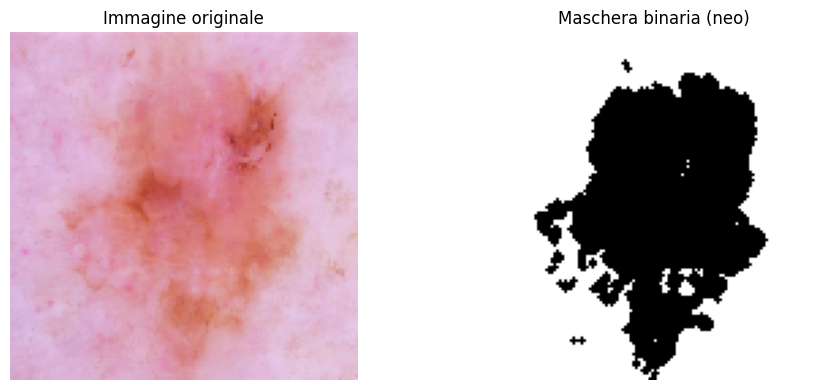

In [ ]:
import matplotlib.pyplot as plt

# Prova su una singola immagine (modifica path secondo il tuo dataset)
test_image_path = "/content/skin_split/test/akiec/ISIC_0031012.jpg"
test_mask = generate_mask(test_image_path)

# Stampa forma e valori unici
print("Forma della maschera:", test_mask.shape)
print("Valori unici nella maschera:", np.unique(test_mask))  # dovresti vedere [0, 255]

# Mostra immagine e maschera affiancate
image = cv2.imread(test_image_path)
image = cv2.resize(image, (128, 128))
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Immagine originale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(test_mask, cmap="gray")
plt.title("Maschera binaria (neo)")
plt.axis("off")

plt.tight_layout()
plt.show()


Si illustra il risultato dell'applicazione su un numero pari N = 5 di immagini.

[1] ISIC_0026327.jpg – Maschera shape: (128, 128), valori: [  0 255]


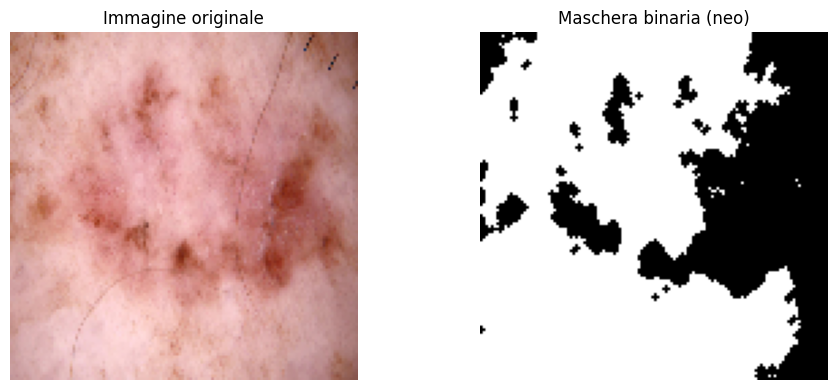

[2] ISIC_0026388.jpg – Maschera shape: (128, 128), valori: [  0 255]


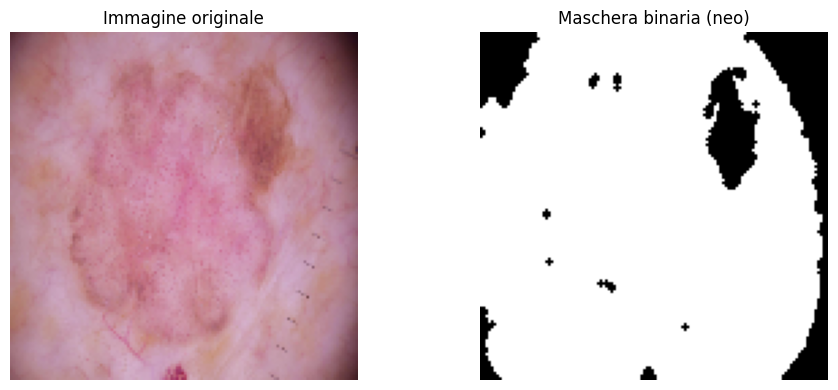

[3] ISIC_0026992.jpg – Maschera shape: (128, 128), valori: [  0 255]


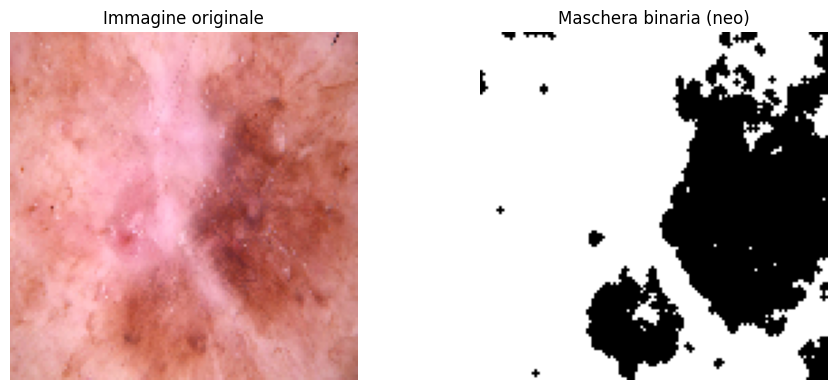

[4] ISIC_0027184.jpg – Maschera shape: (128, 128), valori: [  0 255]


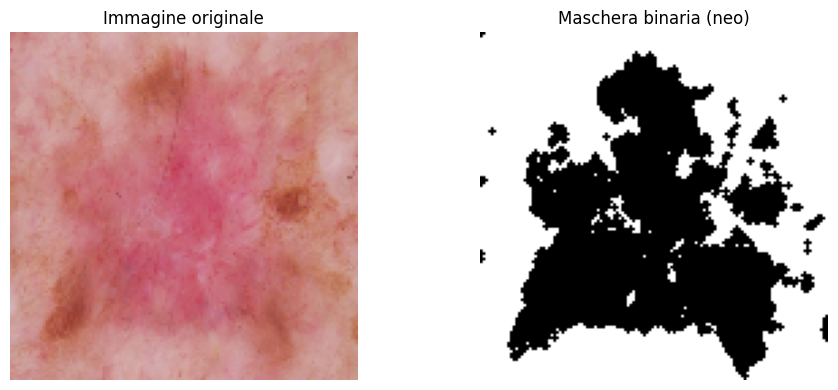

[5] ISIC_0027668.jpg – Maschera shape: (128, 128), valori: [  0 255]


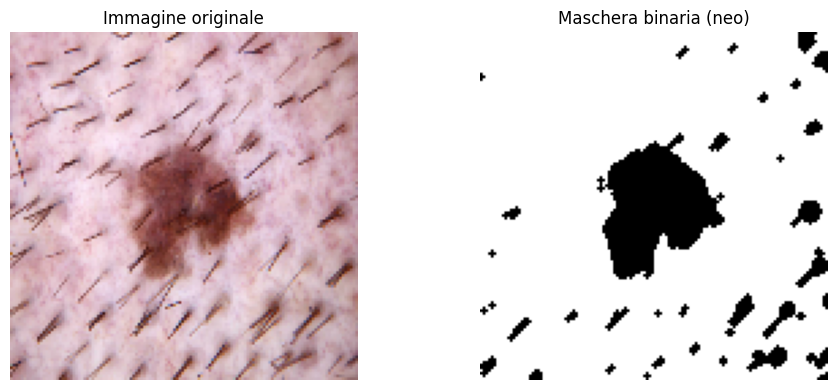

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np

# Cartella della classe da visualizzare
test_class_dir = "/content/skin_split/test/akiec"

# Lista immagini .jpg
image_files = sorted([f for f in os.listdir(test_class_dir) if f.endswith(".jpg")])

# Mostra le prime N immagini con maschera
N = 5  # cambia a piacere
for i in range(min(N, len(image_files))):
    file_name = image_files[i+10]
    img_path = os.path.join(test_class_dir, file_name)

    # Carica immagine
    image = cv2.imread(img_path)
    image = cv2.resize(image, (128, 128))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Genera maschera
    mask = generate_mask(img_path)

    # Controllo maschera
    print(f"[{i+1}] {file_name} – Maschera shape: {mask.shape}, valori: {np.unique(mask)}")

    # Visualizza
    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Immagine originale")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap="gray")
    plt.title("Maschera binaria (neo)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


#CONCLUSIONI & SVILUPPI FUTURI


Nel contesto della classificazione multiclasse, il modello che ha ottenuto le migliori prestazioni in termini di accuracy è la CNN, con un valore pari a 0.706. Tuttavia, l'analisi della recall evidenzia criticità significative: in particolare, per la classe melanoma si registra una recall estremamente bassa (0.1078), a conferma del fatto che il problema dello sbilanciamento tra classi incide in modo rilevante sulle performance. Per questo motivo, il modello non è stato testato nella configurazione binaria, considerata troppo semplice e non informativa in questo contesto.

Passando alla classificazione binaria, i risultati mostrano una maggiore variabilità a seconda dell’approccio adottato. Il metodo basato su feature engineering ha raggiunto un’accuracy di 0.57, mentre l’approccio con SVM su feature estratte ha ottenuto un’accuracy di 0.74, valore condiviso anche dall'SVM addestrata utilizzando metadati categoriali. Quest’ultimo modello si distingue in particolare per una recall di 0.91 sulla classe maligna, risultando quindi il più efficace nell’individuazione dei casi clinicamente rilevanti. Tale risultato è ancora più rilevante considerando la rapidità di addestramento del modello, che lo rende particolarmente interessante anche da un punto di vista operativo.

Per sviluppi futuri, si propone di sperimentare tecniche di data augmentation, come la rotazione o la generazione di immagini sintetiche, nonché l’utilizzo di masking completo e l'impiego di reti neurali pre-addestrate su dataset di grandi dimensioni, come ImageNet. Inoltre, si suggerisce di esplorare architetture più recenti e promettenti come i Vision Transformer (ViT).